# Project Description

This project implements a **Generative Adversarial Network (GAN)** trained on the MNIST dataset to generate realistic handwritten digit images. It features two neural networks: a **Generator**, which transforms random noise into synthetic digit images, and a **Discriminator**, which learns to distinguish these fakes from real MNIST samples. Through adversarial training, where the Generator improves by fooling the Discriminator and the Discriminator sharpens its detection, the system gradually refines the quality of synthetic images, demonstrating core GAN concepts like adversarial loss, network architecture, and training strategies.

---

#### Sources  
- [ashinbabu - GAN_using_MNIST_dataset](https://github.com/ashinbabu/GAN_MNIST/tree/main)  
- [Generating GAN images from training on MNIST dataset](https://medium.com/aimonks/generating-gan-images-from-training-on-mnist-dataset-2e2ec53dfe96)


## Imports and Pakages

In [1]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

## Dataset and Variables

In [2]:
# Set random seed for reproducibility(better for Consistent Results, Easier Debuggingm, and Fair Comparisons)
# The Ultimate Question of Life, the Universe, and Everything
torch.manual_seed(42)
np.random.seed(42)

In [3]:
# Define hyperparameters
num_epochs = 100
batch_size = 64
learning_rate = 0.0002
image_size = 28
image_channels = 1
latent_dim = 100

In [ ]:
# Define image preprocessing steps
transform = transforms.Compose([
    transforms.Resize(image_size),        # Resize each image to the specified size (usually 64x64 for GANs)
    transforms.ToTensor(),                # Convert PIL Image to a PyTorch tensor (with pixel values in [0, 1])
    transforms.Normalize((0.5,), (0.5,)), # Normalize pixel values to [-1, 1] (helps training stability in GANs)
])

In [4]:
#Loads the MNIST dataset (handwritten digits from 0–9) and sav it to ./data with essential preprocessings over images
#First, we will build the dataset and pass its saving route and image preprocessor
#Secondly, via Pytorch Dataloader, we will load our dataset, know its  shuffled, saved, and processed for training aims
mnist_dataset = datasets.MNIST(root='./data',
                               train=True,
                               transform=transform,
                               download=True)

data_loader = DataLoader(dataset=mnist_dataset,
                         batch_size=batch_size,
                         shuffle=True)

Failed to download (trying next):
HTTP Error 404: Not Found



  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



## Model and Training

In [5]:
# Define the generator network for GAN
class Generator(nn.Module):
    '''This generator class which inherite pytorch nn class will build our generator section of CGAN model
    '''
    def __init__(self):
        super(Generator, self).__init__()
        
        # Sequential container defining the generator's layers
        self.model = nn.Sequential(
            # 1st layer: project the latent vector (z) to a 7x7 feature map with 256 channels
            nn.ConvTranspose2d(in_channels=latent_dim, out_channels=256, kernel_size=7, stride=1, padding=0),
            nn.BatchNorm2d(256),               # Normalize the output to stabilize training
            nn.ReLU(inplace=True),             # Activation function for non-linearity

            # 2nd layer: upsample to 14x14 with 128 channels
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # 3rd layer: upsample to 28x28 with desired output channels (usually 1 for MNIST)
            nn.ConvTranspose2d(128, image_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()                          # Output pixel values in range [-1, 1]
        )

    def forward(self, z):
        # Forward pass: input is a latent vector z shaped as (batch_size, latent_dim, 1, 1)
        return self.model(z)


In [6]:
# Define the discriminator network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # 1st convolution: input image (e.g. 1×28×28) → 128×14×14
            nn.Conv2d(in_channels=image_channels, out_channels=128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),  # LeakyReLU activation (allows small negative gradients)
            #inplace=True; Saves memory by modifying the input tensor in-place, without allocating new memory

            # 2nd convolution: 128×14×14 → 256×7×7
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),              # Normalizes activations for stable training
            nn.LeakyReLU(0.2, inplace=True),

            # Final convolution: 256×7×7 → 1×1×1 (a single scalar output)
            nn.Conv2d(256, 1, kernel_size=7, stride=1, padding=0),
            nn.Sigmoid()                      # Squashes output to [0, 1] (interpreted as probability) ->
                                              # is it a fake generated image which is built by our model or
                                              # its a real image without AI interventions
        )

    def forward(self, x):
        return self.model(x)


In [8]:
import torch
print(torch.cuda.is_available())

# Initialize the generator and discriminator with cuda (checkout the availabilty of cuda and GPU resources)
generator = Generator().cuda()
discriminator = Discriminator().cuda()

True


In [9]:
# Define loss and optimizers
# Binary Cross Entropy Loss(we have a binary classification task between fake and real generated imaegs)
#The discriminator uses this loss to distinguish between real and fake images.
# The generator uses it to try to fool the discriminator into thinking fake images are real.

#Why use separate Optimizers?
#   Generator and discriminator are two separate models with competing goals:
#        The discriminator tries to get better at identifying fakes.
#        The generator tries to get better at making fakes that fool the discriminator.
#   Each needs to be trained independently, so they get separate optimizers
criterion = nn.BCELoss()
optimizer_g = torch.optim.Adam(generator.parameters(), lr=learning_rate)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=learning_rate)

Epoch [1/100], Batch [100/938], D_real: 0.9238, D_fake: 0.1482, Loss_D: 0.2705, Loss_G: 3.8543
Epoch [1/100], Batch [200/938], D_real: 0.8802, D_fake: 0.1238, Loss_D: 0.2921, Loss_G: 3.3054
Epoch [1/100], Batch [300/938], D_real: 0.9662, D_fake: 0.1402, Loss_D: 0.2208, Loss_G: 2.8145
Epoch [1/100], Batch [400/938], D_real: 0.8665, D_fake: 0.0634, Loss_D: 0.2354, Loss_G: 3.7427
Epoch [1/100], Batch [500/938], D_real: 0.8821, D_fake: 0.0753, Loss_D: 0.2273, Loss_G: 3.8671
Epoch [1/100], Batch [600/938], D_real: 0.9680, D_fake: 0.2257, Loss_D: 0.3734, Loss_G: 2.7086
Epoch [1/100], Batch [700/938], D_real: 0.9241, D_fake: 0.1073, Loss_D: 0.2055, Loss_G: 4.3277
Epoch [1/100], Batch [800/938], D_real: 0.7136, D_fake: 0.0433, Loss_D: 0.5304, Loss_G: 4.0428
Epoch [1/100], Batch [900/938], D_real: 0.8052, D_fake: 0.0491, Loss_D: 0.3171, Loss_G: 2.5013


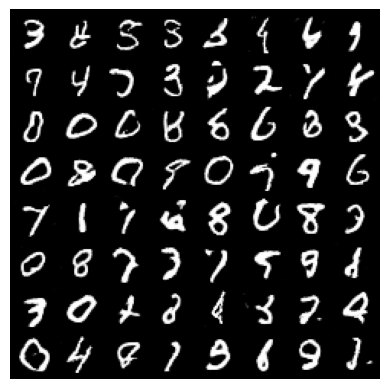

Epoch [2/100], Batch [100/938], D_real: 0.7837, D_fake: 0.0452, Loss_D: 0.3349, Loss_G: 2.5535
Epoch [2/100], Batch [200/938], D_real: 0.9119, D_fake: 0.2687, Loss_D: 0.5203, Loss_G: 2.7569
Epoch [2/100], Batch [300/938], D_real: 0.9640, D_fake: 0.1593, Loss_D: 0.2515, Loss_G: 2.4210
Epoch [2/100], Batch [400/938], D_real: 0.8392, D_fake: 0.1393, Loss_D: 0.3779, Loss_G: 2.4401
Epoch [2/100], Batch [500/938], D_real: 0.8905, D_fake: 0.0612, Loss_D: 0.2021, Loss_G: 3.7618
Epoch [2/100], Batch [600/938], D_real: 0.8604, D_fake: 0.1207, Loss_D: 0.3199, Loss_G: 3.0357
Epoch [2/100], Batch [700/938], D_real: 0.8986, D_fake: 0.1438, Loss_D: 0.3122, Loss_G: 3.8405
Epoch [2/100], Batch [800/938], D_real: 0.9075, D_fake: 0.1080, Loss_D: 0.2355, Loss_G: 3.4554
Epoch [2/100], Batch [900/938], D_real: 0.9838, D_fake: 0.4028, Loss_D: 0.7097, Loss_G: 2.8367


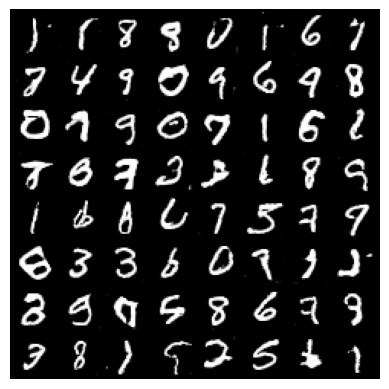

Epoch [3/100], Batch [100/938], D_real: 0.9147, D_fake: 0.1907, Loss_D: 0.3724, Loss_G: 2.4231
Epoch [3/100], Batch [200/938], D_real: 0.7663, D_fake: 0.1074, Loss_D: 0.4419, Loss_G: 2.9596
Epoch [3/100], Batch [300/938], D_real: 0.9637, D_fake: 0.2853, Loss_D: 0.4941, Loss_G: 2.9838
Epoch [3/100], Batch [400/938], D_real: 0.9433, D_fake: 0.1519, Loss_D: 0.2886, Loss_G: 3.0574
Epoch [3/100], Batch [500/938], D_real: 0.8602, D_fake: 0.1175, Loss_D: 0.3311, Loss_G: 3.5496
Epoch [3/100], Batch [600/938], D_real: 0.7755, D_fake: 0.1177, Loss_D: 0.4782, Loss_G: 2.7479
Epoch [3/100], Batch [700/938], D_real: 0.9185, D_fake: 0.1442, Loss_D: 0.2833, Loss_G: 2.4621
Epoch [3/100], Batch [800/938], D_real: 0.8433, D_fake: 0.0561, Loss_D: 0.2608, Loss_G: 3.9778
Epoch [3/100], Batch [900/938], D_real: 0.8237, D_fake: 0.0621, Loss_D: 0.2949, Loss_G: 3.6101


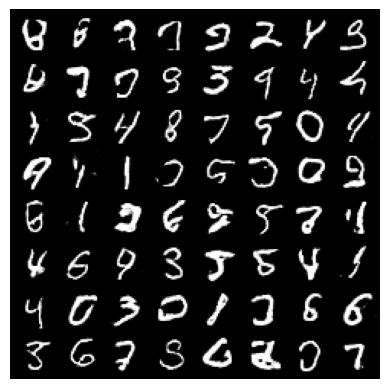

Epoch [4/100], Batch [100/938], D_real: 0.5881, D_fake: 0.0193, Loss_D: 0.7195, Loss_G: 4.6722
Epoch [4/100], Batch [200/938], D_real: 0.9437, D_fake: 0.2408, Loss_D: 0.4048, Loss_G: 3.0791
Epoch [4/100], Batch [300/938], D_real: 0.9331, D_fake: 0.0376, Loss_D: 0.1185, Loss_G: 4.9054
Epoch [4/100], Batch [400/938], D_real: 0.6812, D_fake: 0.1265, Loss_D: 0.6684, Loss_G: 2.4759
Epoch [4/100], Batch [500/938], D_real: 0.9170, D_fake: 0.1317, Loss_D: 0.2762, Loss_G: 4.2361
Epoch [4/100], Batch [600/938], D_real: 0.9170, D_fake: 0.1046, Loss_D: 0.2350, Loss_G: 3.3046
Epoch [4/100], Batch [700/938], D_real: 0.9279, D_fake: 0.1450, Loss_D: 0.3013, Loss_G: 2.9551
Epoch [4/100], Batch [800/938], D_real: 0.8655, D_fake: 0.1422, Loss_D: 0.3568, Loss_G: 2.3877
Epoch [4/100], Batch [900/938], D_real: 0.8878, D_fake: 0.0544, Loss_D: 0.1993, Loss_G: 3.6487


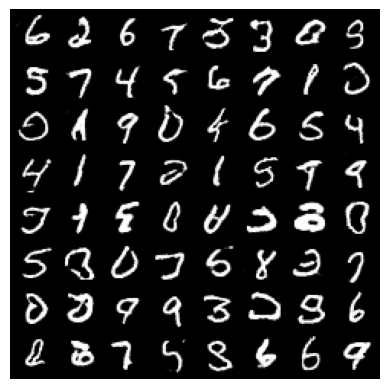

Epoch [5/100], Batch [100/938], D_real: 0.9240, D_fake: 0.1328, Loss_D: 0.2695, Loss_G: 1.4606
Epoch [5/100], Batch [200/938], D_real: 0.6675, D_fake: 0.0408, Loss_D: 0.5897, Loss_G: 3.7806
Epoch [5/100], Batch [300/938], D_real: 0.6336, D_fake: 0.0409, Loss_D: 0.6247, Loss_G: 2.2007
Epoch [5/100], Batch [400/938], D_real: 0.7888, D_fake: 0.0805, Loss_D: 0.4299, Loss_G: 2.9299
Epoch [5/100], Batch [500/938], D_real: 0.9296, D_fake: 0.1315, Loss_D: 0.2577, Loss_G: 3.2218
Epoch [5/100], Batch [600/938], D_real: 0.8956, D_fake: 0.2198, Loss_D: 0.4690, Loss_G: 2.4734
Epoch [5/100], Batch [700/938], D_real: 0.7881, D_fake: 0.0923, Loss_D: 0.4375, Loss_G: 2.9643
Epoch [5/100], Batch [800/938], D_real: 0.7406, D_fake: 0.1830, Loss_D: 0.6320, Loss_G: 2.3354
Epoch [5/100], Batch [900/938], D_real: 0.9507, D_fake: 0.2496, Loss_D: 0.3978, Loss_G: 2.4461


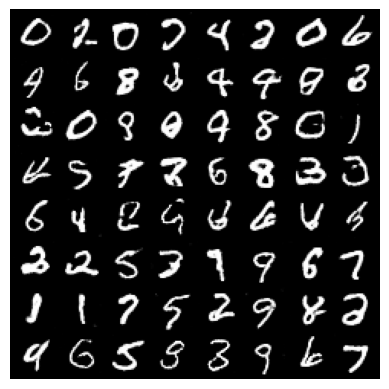

Epoch [6/100], Batch [100/938], D_real: 0.8668, D_fake: 0.0505, Loss_D: 0.2236, Loss_G: 4.1143
Epoch [6/100], Batch [200/938], D_real: 0.6636, D_fake: 0.0362, Loss_D: 0.6575, Loss_G: 3.6202
Epoch [6/100], Batch [300/938], D_real: 0.7226, D_fake: 0.0731, Loss_D: 0.5516, Loss_G: 4.1791
Epoch [6/100], Batch [400/938], D_real: 0.7420, D_fake: 0.0400, Loss_D: 0.4342, Loss_G: 4.7765
Epoch [6/100], Batch [500/938], D_real: 0.9860, D_fake: 0.3659, Loss_D: 0.6581, Loss_G: 2.3927
Epoch [6/100], Batch [600/938], D_real: 0.9764, D_fake: 0.2903, Loss_D: 0.4753, Loss_G: 2.7539
Epoch [6/100], Batch [700/938], D_real: 0.8372, D_fake: 0.0621, Loss_D: 0.2807, Loss_G: 4.4398
Epoch [6/100], Batch [800/938], D_real: 0.7210, D_fake: 0.0300, Loss_D: 0.4514, Loss_G: 4.9723
Epoch [6/100], Batch [900/938], D_real: 0.8425, D_fake: 0.0804, Loss_D: 0.3309, Loss_G: 3.0982


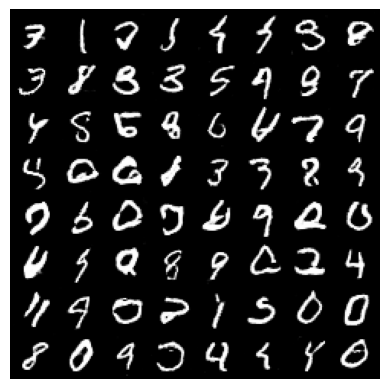

Epoch [7/100], Batch [100/938], D_real: 0.8518, D_fake: 0.1433, Loss_D: 0.3848, Loss_G: 2.6140
Epoch [7/100], Batch [200/938], D_real: 0.8888, D_fake: 0.0923, Loss_D: 0.2473, Loss_G: 3.8124
Epoch [7/100], Batch [300/938], D_real: 0.8911, D_fake: 0.1005, Loss_D: 0.2509, Loss_G: 3.0645
Epoch [7/100], Batch [400/938], D_real: 0.9251, D_fake: 0.0957, Loss_D: 0.1942, Loss_G: 4.2435
Epoch [7/100], Batch [500/938], D_real: 0.8402, D_fake: 0.1614, Loss_D: 0.4073, Loss_G: 3.4677
Epoch [7/100], Batch [600/938], D_real: 0.8632, D_fake: 0.1023, Loss_D: 0.3231, Loss_G: 3.9811
Epoch [7/100], Batch [700/938], D_real: 0.9317, D_fake: 0.1529, Loss_D: 0.2913, Loss_G: 4.1952
Epoch [7/100], Batch [800/938], D_real: 0.9067, D_fake: 0.0661, Loss_D: 0.2129, Loss_G: 4.5490
Epoch [7/100], Batch [900/938], D_real: 0.7529, D_fake: 0.0728, Loss_D: 0.4369, Loss_G: 2.1791


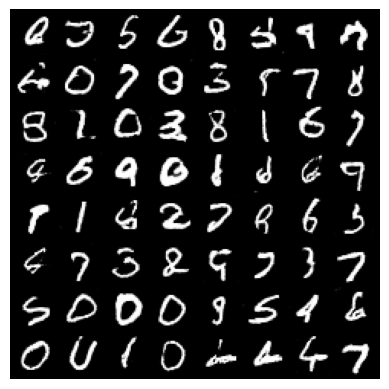

Epoch [8/100], Batch [100/938], D_real: 0.9060, D_fake: 0.2094, Loss_D: 0.4162, Loss_G: 2.8039
Epoch [8/100], Batch [200/938], D_real: 0.9324, D_fake: 0.1422, Loss_D: 0.2443, Loss_G: 2.8284
Epoch [8/100], Batch [300/938], D_real: 0.8968, D_fake: 0.1319, Loss_D: 0.3076, Loss_G: 3.2908
Epoch [8/100], Batch [400/938], D_real: 0.9423, D_fake: 0.1155, Loss_D: 0.2084, Loss_G: 3.7937
Epoch [8/100], Batch [500/938], D_real: 0.7236, D_fake: 0.0260, Loss_D: 0.4482, Loss_G: 5.5203
Epoch [8/100], Batch [600/938], D_real: 0.6263, D_fake: 0.0238, Loss_D: 0.6189, Loss_G: 4.5058
Epoch [8/100], Batch [700/938], D_real: 0.8469, D_fake: 0.0639, Loss_D: 0.2716, Loss_G: 3.3116
Epoch [8/100], Batch [800/938], D_real: 0.9957, D_fake: 0.2159, Loss_D: 0.3120, Loss_G: 3.0367
Epoch [8/100], Batch [900/938], D_real: 0.8038, D_fake: 0.0873, Loss_D: 0.3769, Loss_G: 3.3928


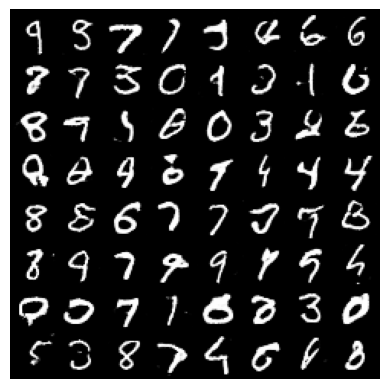

Epoch [9/100], Batch [100/938], D_real: 0.9411, D_fake: 0.1630, Loss_D: 0.2795, Loss_G: 2.6040
Epoch [9/100], Batch [200/938], D_real: 0.8146, D_fake: 0.0685, Loss_D: 0.3193, Loss_G: 3.7348
Epoch [9/100], Batch [300/938], D_real: 0.7438, D_fake: 0.1608, Loss_D: 0.6347, Loss_G: 2.2396
Epoch [9/100], Batch [400/938], D_real: 0.8589, D_fake: 0.0832, Loss_D: 0.2989, Loss_G: 3.3538
Epoch [9/100], Batch [500/938], D_real: 0.8054, D_fake: 0.1815, Loss_D: 0.5716, Loss_G: 3.6634
Epoch [9/100], Batch [600/938], D_real: 0.8194, D_fake: 0.0706, Loss_D: 0.3505, Loss_G: 3.9582
Epoch [9/100], Batch [700/938], D_real: 0.9297, D_fake: 0.0176, Loss_D: 0.1009, Loss_G: 4.2046
Epoch [9/100], Batch [800/938], D_real: 0.9281, D_fake: 0.1284, Loss_D: 0.2413, Loss_G: 3.1169
Epoch [9/100], Batch [900/938], D_real: 0.8934, D_fake: 0.1380, Loss_D: 0.3222, Loss_G: 2.9645


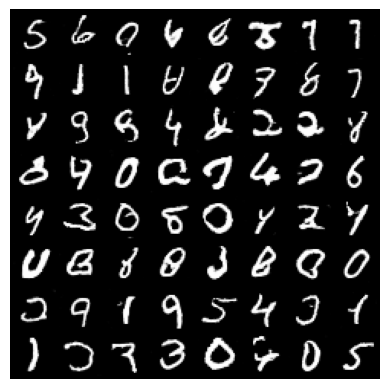

Epoch [10/100], Batch [100/938], D_real: 0.9435, D_fake: 0.1929, Loss_D: 0.3167, Loss_G: 3.8761
Epoch [10/100], Batch [200/938], D_real: 0.8893, D_fake: 0.1159, Loss_D: 0.3038, Loss_G: 3.4701
Epoch [10/100], Batch [300/938], D_real: 0.7483, D_fake: 0.0867, Loss_D: 0.4952, Loss_G: 2.6765
Epoch [10/100], Batch [400/938], D_real: 0.9392, D_fake: 0.2229, Loss_D: 0.3932, Loss_G: 1.8802
Epoch [10/100], Batch [500/938], D_real: 0.8979, D_fake: 0.1152, Loss_D: 0.2700, Loss_G: 2.7112
Epoch [10/100], Batch [600/938], D_real: 0.9641, D_fake: 0.3087, Loss_D: 0.5123, Loss_G: 2.4126
Epoch [10/100], Batch [700/938], D_real: 0.8829, D_fake: 0.1117, Loss_D: 0.2782, Loss_G: 2.8451
Epoch [10/100], Batch [800/938], D_real: 0.8430, D_fake: 0.1690, Loss_D: 0.4396, Loss_G: 2.9673
Epoch [10/100], Batch [900/938], D_real: 0.8700, D_fake: 0.1572, Loss_D: 0.3632, Loss_G: 3.0084


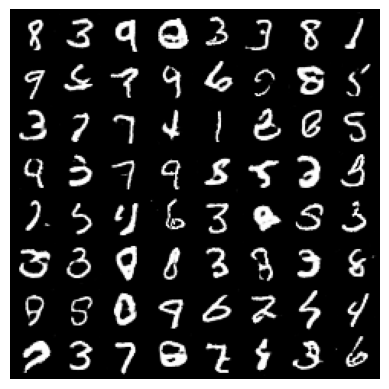

Epoch [11/100], Batch [100/938], D_real: 0.7526, D_fake: 0.0858, Loss_D: 0.4446, Loss_G: 3.0947
Epoch [11/100], Batch [200/938], D_real: 0.8506, D_fake: 0.2009, Loss_D: 0.4845, Loss_G: 2.6606
Epoch [11/100], Batch [300/938], D_real: 0.8456, D_fake: 0.0972, Loss_D: 0.3251, Loss_G: 4.4811
Epoch [11/100], Batch [400/938], D_real: 0.9424, D_fake: 0.1421, Loss_D: 0.2485, Loss_G: 3.3754
Epoch [11/100], Batch [500/938], D_real: 0.8469, D_fake: 0.0842, Loss_D: 0.3004, Loss_G: 2.4088
Epoch [11/100], Batch [600/938], D_real: 0.8055, D_fake: 0.1031, Loss_D: 0.4226, Loss_G: 3.7059
Epoch [11/100], Batch [700/938], D_real: 0.8750, D_fake: 0.1452, Loss_D: 0.3800, Loss_G: 4.7950
Epoch [11/100], Batch [800/938], D_real: 0.9438, D_fake: 0.1837, Loss_D: 0.3132, Loss_G: 3.1331
Epoch [11/100], Batch [900/938], D_real: 0.8761, D_fake: 0.0875, Loss_D: 0.2910, Loss_G: 3.9616


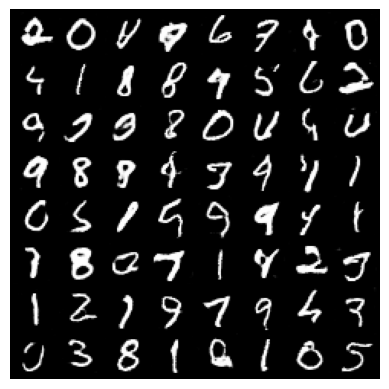

Epoch [12/100], Batch [100/938], D_real: 0.8622, D_fake: 0.1948, Loss_D: 0.4244, Loss_G: 2.6839
Epoch [12/100], Batch [200/938], D_real: 0.9329, D_fake: 0.0540, Loss_D: 0.1412, Loss_G: 4.4813
Epoch [12/100], Batch [300/938], D_real: 0.7996, D_fake: 0.0755, Loss_D: 0.3447, Loss_G: 2.5369
Epoch [12/100], Batch [400/938], D_real: 0.7806, D_fake: 0.0566, Loss_D: 0.3623, Loss_G: 3.4364
Epoch [12/100], Batch [500/938], D_real: 0.8396, D_fake: 0.0613, Loss_D: 0.2706, Loss_G: 2.8181
Epoch [12/100], Batch [600/938], D_real: 0.4675, D_fake: 0.0053, Loss_D: 1.0581, Loss_G: 4.6402
Epoch [12/100], Batch [700/938], D_real: 0.8095, D_fake: 0.0361, Loss_D: 0.2917, Loss_G: 4.4944
Epoch [12/100], Batch [800/938], D_real: 0.8619, D_fake: 0.1031, Loss_D: 0.3268, Loss_G: 3.2063
Epoch [12/100], Batch [900/938], D_real: 0.8905, D_fake: 0.1914, Loss_D: 0.3960, Loss_G: 3.1777


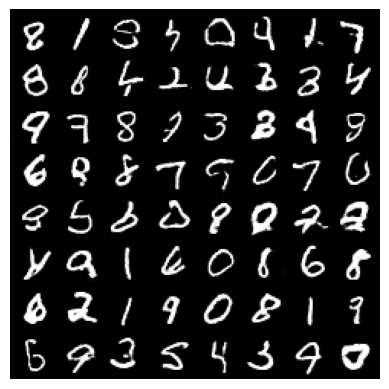

Epoch [13/100], Batch [100/938], D_real: 0.8726, D_fake: 0.0523, Loss_D: 0.2176, Loss_G: 3.8372
Epoch [13/100], Batch [200/938], D_real: 0.8019, D_fake: 0.0408, Loss_D: 0.3029, Loss_G: 3.8878
Epoch [13/100], Batch [300/938], D_real: 0.6883, D_fake: 0.0480, Loss_D: 0.5086, Loss_G: 2.9473
Epoch [13/100], Batch [400/938], D_real: 0.5254, D_fake: 0.0098, Loss_D: 0.9662, Loss_G: 6.4616
Epoch [13/100], Batch [500/938], D_real: 0.7834, D_fake: 0.0345, Loss_D: 0.3645, Loss_G: 4.7348
Epoch [13/100], Batch [600/938], D_real: 0.7888, D_fake: 0.1377, Loss_D: 0.5428, Loss_G: 2.5442
Epoch [13/100], Batch [700/938], D_real: 0.9484, D_fake: 0.2036, Loss_D: 0.3453, Loss_G: 2.4865
Epoch [13/100], Batch [800/938], D_real: 0.9615, D_fake: 0.2806, Loss_D: 0.4972, Loss_G: 3.0396
Epoch [13/100], Batch [900/938], D_real: 0.8385, D_fake: 0.1110, Loss_D: 0.3610, Loss_G: 3.0203


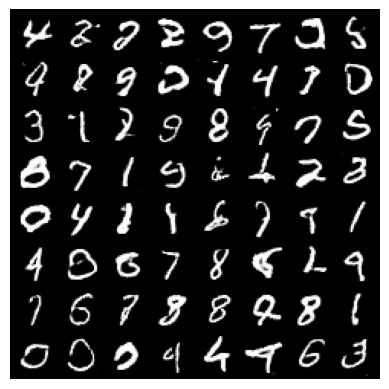

Epoch [14/100], Batch [100/938], D_real: 0.9182, D_fake: 0.2212, Loss_D: 0.4578, Loss_G: 3.2343
Epoch [14/100], Batch [200/938], D_real: 0.9692, D_fake: 0.1906, Loss_D: 0.2982, Loss_G: 2.2681
Epoch [14/100], Batch [300/938], D_real: 0.9195, D_fake: 0.0899, Loss_D: 0.2206, Loss_G: 4.2868
Epoch [14/100], Batch [400/938], D_real: 0.9295, D_fake: 0.0811, Loss_D: 0.1762, Loss_G: 4.1483
Epoch [14/100], Batch [500/938], D_real: 0.8880, D_fake: 0.0884, Loss_D: 0.2530, Loss_G: 3.6381
Epoch [14/100], Batch [600/938], D_real: 0.8186, D_fake: 0.0699, Loss_D: 0.3376, Loss_G: 3.3897
Epoch [14/100], Batch [700/938], D_real: 0.9880, D_fake: 0.3070, Loss_D: 0.5347, Loss_G: 2.2749
Epoch [14/100], Batch [800/938], D_real: 0.7983, D_fake: 0.0377, Loss_D: 0.3147, Loss_G: 4.2567
Epoch [14/100], Batch [900/938], D_real: 0.9535, D_fake: 0.1177, Loss_D: 0.1951, Loss_G: 2.9648


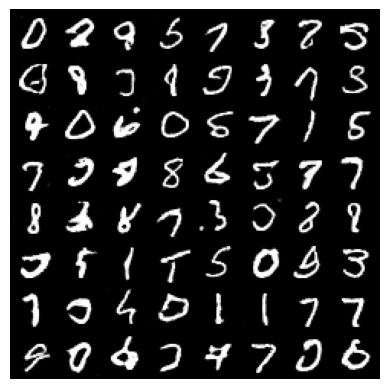

Epoch [15/100], Batch [100/938], D_real: 0.8931, D_fake: 0.0570, Loss_D: 0.2164, Loss_G: 3.1177
Epoch [15/100], Batch [200/938], D_real: 0.9457, D_fake: 0.1050, Loss_D: 0.1874, Loss_G: 3.2142
Epoch [15/100], Batch [300/938], D_real: 0.8096, D_fake: 0.0409, Loss_D: 0.3039, Loss_G: 3.7192
Epoch [15/100], Batch [400/938], D_real: 0.8682, D_fake: 0.0522, Loss_D: 0.2193, Loss_G: 2.5717
Epoch [15/100], Batch [500/938], D_real: 0.8182, D_fake: 0.0128, Loss_D: 0.2673, Loss_G: 5.5137
Epoch [15/100], Batch [600/938], D_real: 0.9625, D_fake: 0.1529, Loss_D: 0.2731, Loss_G: 3.3571
Epoch [15/100], Batch [700/938], D_real: 0.7432, D_fake: 0.1039, Loss_D: 0.5204, Loss_G: 2.3443
Epoch [15/100], Batch [800/938], D_real: 0.9300, D_fake: 0.1877, Loss_D: 0.3518, Loss_G: 2.3184
Epoch [15/100], Batch [900/938], D_real: 0.5136, D_fake: 0.0364, Loss_D: 1.0544, Loss_G: 3.5664


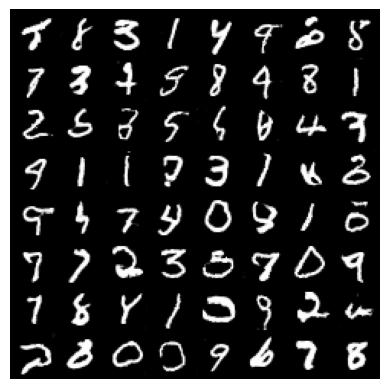

Epoch [16/100], Batch [100/938], D_real: 0.8517, D_fake: 0.0891, Loss_D: 0.2963, Loss_G: 2.9145
Epoch [16/100], Batch [200/938], D_real: 0.7458, D_fake: 0.0617, Loss_D: 0.4508, Loss_G: 3.0031
Epoch [16/100], Batch [300/938], D_real: 0.9611, D_fake: 0.2222, Loss_D: 0.3760, Loss_G: 3.3980
Epoch [16/100], Batch [400/938], D_real: 0.9066, D_fake: 0.0907, Loss_D: 0.2209, Loss_G: 3.1366
Epoch [16/100], Batch [500/938], D_real: 0.7341, D_fake: 0.0989, Loss_D: 0.5187, Loss_G: 2.6071
Epoch [16/100], Batch [600/938], D_real: 0.9195, D_fake: 0.1533, Loss_D: 0.3234, Loss_G: 2.6184
Epoch [16/100], Batch [700/938], D_real: 0.9626, D_fake: 0.3246, Loss_D: 0.5854, Loss_G: 2.6455
Epoch [16/100], Batch [800/938], D_real: 0.8682, D_fake: 0.0509, Loss_D: 0.2221, Loss_G: 4.6229
Epoch [16/100], Batch [900/938], D_real: 0.9126, D_fake: 0.1976, Loss_D: 0.3758, Loss_G: 1.6781


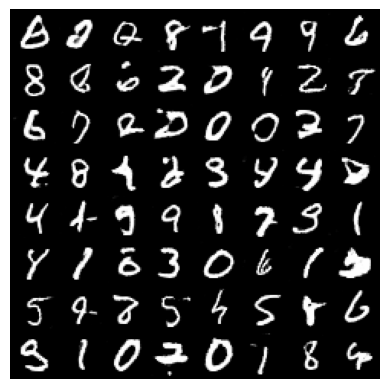

Epoch [17/100], Batch [100/938], D_real: 0.8074, D_fake: 0.1801, Loss_D: 0.5647, Loss_G: 2.6784
Epoch [17/100], Batch [200/938], D_real: 0.8813, D_fake: 0.1313, Loss_D: 0.3184, Loss_G: 3.6538
Epoch [17/100], Batch [300/938], D_real: 0.9137, D_fake: 0.1084, Loss_D: 0.2627, Loss_G: 1.7659
Epoch [17/100], Batch [400/938], D_real: 0.9565, D_fake: 0.4204, Loss_D: 0.8622, Loss_G: 2.2156
Epoch [17/100], Batch [500/938], D_real: 0.7745, D_fake: 0.0265, Loss_D: 0.3609, Loss_G: 5.1286
Epoch [17/100], Batch [600/938], D_real: 0.7083, D_fake: 0.0236, Loss_D: 0.5067, Loss_G: 4.6147
Epoch [17/100], Batch [700/938], D_real: 0.7487, D_fake: 0.1275, Loss_D: 0.4929, Loss_G: 2.0679
Epoch [17/100], Batch [800/938], D_real: 0.9017, D_fake: 0.0590, Loss_D: 0.1863, Loss_G: 4.2163
Epoch [17/100], Batch [900/938], D_real: 0.8504, D_fake: 0.0570, Loss_D: 0.2395, Loss_G: 3.7699


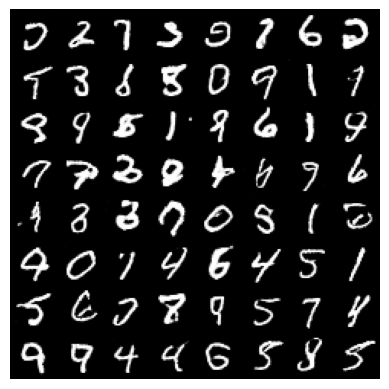

Epoch [18/100], Batch [100/938], D_real: 0.9206, D_fake: 0.1097, Loss_D: 0.2269, Loss_G: 3.7256
Epoch [18/100], Batch [200/938], D_real: 0.6892, D_fake: 0.0230, Loss_D: 0.4928, Loss_G: 5.6216
Epoch [18/100], Batch [300/938], D_real: 0.7978, D_fake: 0.0593, Loss_D: 0.3939, Loss_G: 2.1670
Epoch [18/100], Batch [400/938], D_real: 0.7569, D_fake: 0.0814, Loss_D: 0.4616, Loss_G: 2.8444
Epoch [18/100], Batch [500/938], D_real: 0.6720, D_fake: 0.0784, Loss_D: 0.6599, Loss_G: 3.7861
Epoch [18/100], Batch [600/938], D_real: 0.9189, D_fake: 0.1835, Loss_D: 0.3553, Loss_G: 3.1636
Epoch [18/100], Batch [700/938], D_real: 0.7833, D_fake: 0.0379, Loss_D: 0.3427, Loss_G: 4.9332
Epoch [18/100], Batch [800/938], D_real: 0.7953, D_fake: 0.0791, Loss_D: 0.3844, Loss_G: 2.7015
Epoch [18/100], Batch [900/938], D_real: 0.9254, D_fake: 0.0607, Loss_D: 0.1647, Loss_G: 4.3815


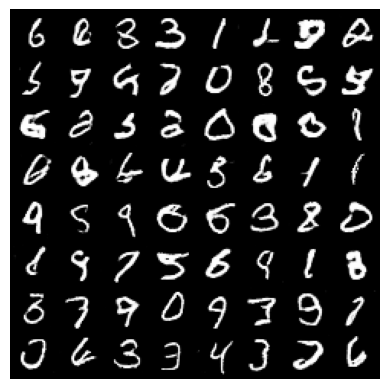

Epoch [19/100], Batch [100/938], D_real: 0.9583, D_fake: 0.3007, Loss_D: 0.5422, Loss_G: 3.0149
Epoch [19/100], Batch [200/938], D_real: 0.8873, D_fake: 0.0792, Loss_D: 0.2326, Loss_G: 4.0348
Epoch [19/100], Batch [300/938], D_real: 0.9226, D_fake: 0.1943, Loss_D: 0.3519, Loss_G: 2.9127
Epoch [19/100], Batch [400/938], D_real: 0.9610, D_fake: 0.1797, Loss_D: 0.3148, Loss_G: 2.0237
Epoch [19/100], Batch [500/938], D_real: 0.9711, D_fake: 0.1306, Loss_D: 0.1838, Loss_G: 2.7432
Epoch [19/100], Batch [600/938], D_real: 0.9539, D_fake: 0.1420, Loss_D: 0.2578, Loss_G: 3.8271
Epoch [19/100], Batch [700/938], D_real: 0.8705, D_fake: 0.1264, Loss_D: 0.3256, Loss_G: 3.2351
Epoch [19/100], Batch [800/938], D_real: 0.8515, D_fake: 0.0635, Loss_D: 0.2590, Loss_G: 4.0104
Epoch [19/100], Batch [900/938], D_real: 0.9050, D_fake: 0.1086, Loss_D: 0.2616, Loss_G: 2.5846


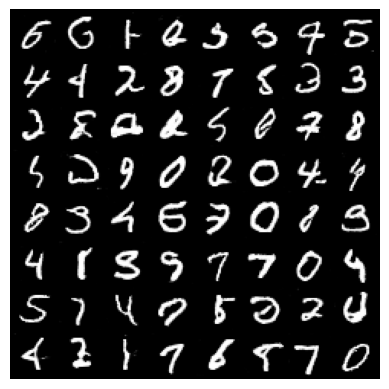

Epoch [20/100], Batch [100/938], D_real: 0.7794, D_fake: 0.0725, Loss_D: 0.3930, Loss_G: 3.0455
Epoch [20/100], Batch [200/938], D_real: 0.8063, D_fake: 0.0483, Loss_D: 0.3019, Loss_G: 2.9297
Epoch [20/100], Batch [300/938], D_real: 0.8806, D_fake: 0.1982, Loss_D: 0.4329, Loss_G: 3.0936
Epoch [20/100], Batch [400/938], D_real: 0.9349, D_fake: 0.2294, Loss_D: 0.4164, Loss_G: 2.3166
Epoch [20/100], Batch [500/938], D_real: 0.9640, D_fake: 0.1657, Loss_D: 0.2638, Loss_G: 3.6874
Epoch [20/100], Batch [600/938], D_real: 0.8730, D_fake: 0.1532, Loss_D: 0.3583, Loss_G: 3.1901
Epoch [20/100], Batch [700/938], D_real: 0.9392, D_fake: 0.0712, Loss_D: 0.1531, Loss_G: 4.2883
Epoch [20/100], Batch [800/938], D_real: 0.9384, D_fake: 0.0207, Loss_D: 0.0921, Loss_G: 5.0419
Epoch [20/100], Batch [900/938], D_real: 0.7109, D_fake: 0.2591, Loss_D: 0.9005, Loss_G: 1.3787


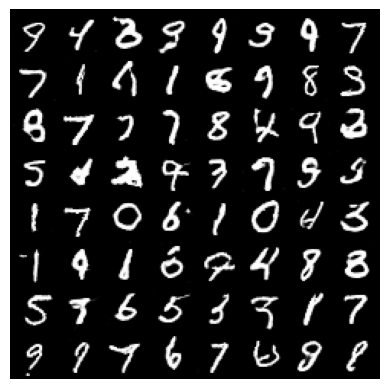

Epoch [21/100], Batch [100/938], D_real: 0.5183, D_fake: 0.0503, Loss_D: 0.9191, Loss_G: 2.3154
Epoch [21/100], Batch [200/938], D_real: 0.9722, D_fake: 0.3031, Loss_D: 0.5248, Loss_G: 2.4856
Epoch [21/100], Batch [300/938], D_real: 0.6586, D_fake: 0.0453, Loss_D: 0.5747, Loss_G: 3.0070
Epoch [21/100], Batch [400/938], D_real: 0.8567, D_fake: 0.0396, Loss_D: 0.2416, Loss_G: 3.4377
Epoch [21/100], Batch [500/938], D_real: 0.6509, D_fake: 0.0362, Loss_D: 0.6049, Loss_G: 3.6657
Epoch [21/100], Batch [600/938], D_real: 0.7037, D_fake: 0.0239, Loss_D: 0.4462, Loss_G: 4.7900
Epoch [21/100], Batch [700/938], D_real: 0.9625, D_fake: 0.1568, Loss_D: 0.2581, Loss_G: 3.0781
Epoch [21/100], Batch [800/938], D_real: 0.9825, D_fake: 0.2928, Loss_D: 0.4843, Loss_G: 4.1663
Epoch [21/100], Batch [900/938], D_real: 0.8403, D_fake: 0.1058, Loss_D: 0.3548, Loss_G: 3.2572


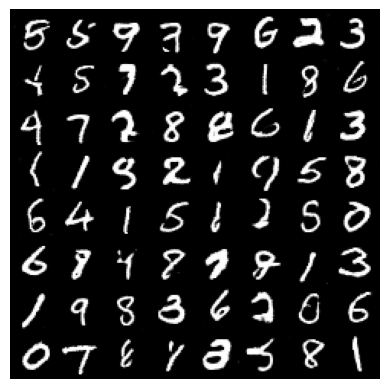

Epoch [22/100], Batch [100/938], D_real: 0.7771, D_fake: 0.0221, Loss_D: 0.3444, Loss_G: 4.7343
Epoch [22/100], Batch [200/938], D_real: 0.9376, D_fake: 0.0914, Loss_D: 0.2153, Loss_G: 5.0913
Epoch [22/100], Batch [300/938], D_real: 0.9051, D_fake: 0.0802, Loss_D: 0.2149, Loss_G: 4.3281
Epoch [22/100], Batch [400/938], D_real: 0.9090, D_fake: 0.0978, Loss_D: 0.2245, Loss_G: 3.7387
Epoch [22/100], Batch [500/938], D_real: 0.9279, D_fake: 0.1251, Loss_D: 0.2336, Loss_G: 2.6721
Epoch [22/100], Batch [600/938], D_real: 0.9349, D_fake: 0.1657, Loss_D: 0.3213, Loss_G: 3.5249
Epoch [22/100], Batch [700/938], D_real: 0.8876, D_fake: 0.0957, Loss_D: 0.2580, Loss_G: 3.3285
Epoch [22/100], Batch [800/938], D_real: 0.8755, D_fake: 0.2285, Loss_D: 0.4903, Loss_G: 3.1126
Epoch [22/100], Batch [900/938], D_real: 0.9502, D_fake: 0.1687, Loss_D: 0.2888, Loss_G: 2.9825


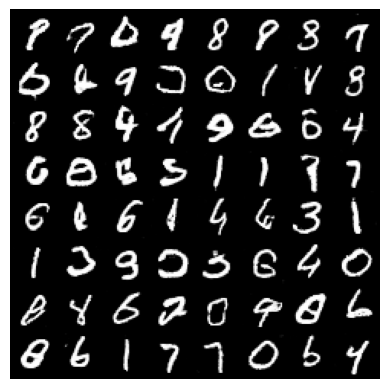

Epoch [23/100], Batch [100/938], D_real: 0.9395, D_fake: 0.0572, Loss_D: 0.1332, Loss_G: 3.6140
Epoch [23/100], Batch [200/938], D_real: 0.8885, D_fake: 0.0374, Loss_D: 0.1761, Loss_G: 3.4851
Epoch [23/100], Batch [300/938], D_real: 0.5467, D_fake: 0.0200, Loss_D: 0.7715, Loss_G: 2.9092
Epoch [23/100], Batch [400/938], D_real: 0.9234, D_fake: 0.1289, Loss_D: 0.2700, Loss_G: 2.5087
Epoch [23/100], Batch [500/938], D_real: 0.9515, D_fake: 0.2427, Loss_D: 0.4030, Loss_G: 3.1243
Epoch [23/100], Batch [600/938], D_real: 0.9612, D_fake: 0.1309, Loss_D: 0.2039, Loss_G: 2.8209
Epoch [23/100], Batch [700/938], D_real: 0.9666, D_fake: 0.3002, Loss_D: 0.5640, Loss_G: 2.8397
Epoch [23/100], Batch [800/938], D_real: 0.9681, D_fake: 0.1676, Loss_D: 0.2535, Loss_G: 3.6495
Epoch [23/100], Batch [900/938], D_real: 0.8756, D_fake: 0.0954, Loss_D: 0.2727, Loss_G: 2.9454


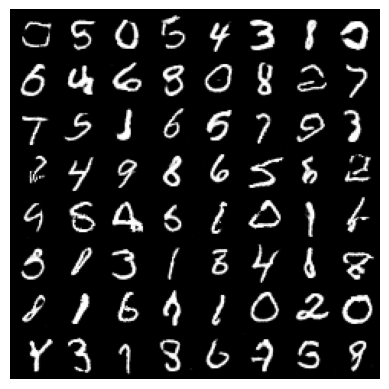

Epoch [24/100], Batch [100/938], D_real: 0.8727, D_fake: 0.1865, Loss_D: 0.4250, Loss_G: 2.8629
Epoch [24/100], Batch [200/938], D_real: 0.8372, D_fake: 0.0535, Loss_D: 0.2703, Loss_G: 4.6267
Epoch [24/100], Batch [300/938], D_real: 0.9717, D_fake: 0.2114, Loss_D: 0.3550, Loss_G: 1.8537
Epoch [24/100], Batch [400/938], D_real: 0.8046, D_fake: 0.0865, Loss_D: 0.4000, Loss_G: 3.8498
Epoch [24/100], Batch [500/938], D_real: 0.9348, D_fake: 0.1735, Loss_D: 0.3267, Loss_G: 2.1745
Epoch [24/100], Batch [600/938], D_real: 0.7850, D_fake: 0.0422, Loss_D: 0.3576, Loss_G: 3.9958
Epoch [24/100], Batch [700/938], D_real: 0.9216, D_fake: 0.1131, Loss_D: 0.2388, Loss_G: 3.0916
Epoch [24/100], Batch [800/938], D_real: 0.9372, D_fake: 0.0845, Loss_D: 0.1823, Loss_G: 3.6019
Epoch [24/100], Batch [900/938], D_real: 0.8340, D_fake: 0.0558, Loss_D: 0.2832, Loss_G: 3.7341


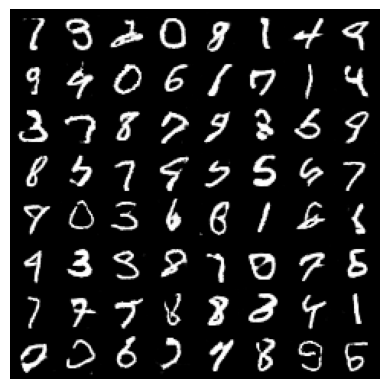

Epoch [25/100], Batch [100/938], D_real: 0.8086, D_fake: 0.0218, Loss_D: 0.2702, Loss_G: 4.2100
Epoch [25/100], Batch [200/938], D_real: 0.9445, D_fake: 0.1066, Loss_D: 0.1987, Loss_G: 3.4735
Epoch [25/100], Batch [300/938], D_real: 0.9719, D_fake: 0.2034, Loss_D: 0.2996, Loss_G: 2.5854
Epoch [25/100], Batch [400/938], D_real: 0.9342, D_fake: 0.1104, Loss_D: 0.2082, Loss_G: 3.8803
Epoch [25/100], Batch [500/938], D_real: 0.9190, D_fake: 0.2542, Loss_D: 0.4987, Loss_G: 2.7289
Epoch [25/100], Batch [600/938], D_real: 0.9137, D_fake: 0.1003, Loss_D: 0.2365, Loss_G: 2.6348
Epoch [25/100], Batch [700/938], D_real: 0.8344, D_fake: 0.0538, Loss_D: 0.2699, Loss_G: 4.0941
Epoch [25/100], Batch [800/938], D_real: 0.8926, D_fake: 0.0712, Loss_D: 0.2067, Loss_G: 4.0834
Epoch [25/100], Batch [900/938], D_real: 0.9462, D_fake: 0.0938, Loss_D: 0.1776, Loss_G: 4.6970


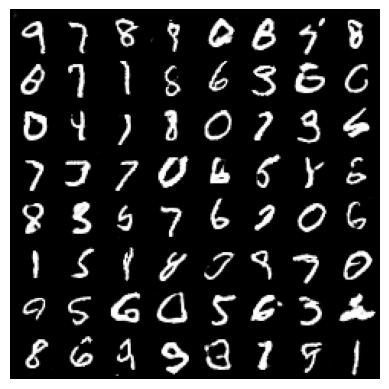

Epoch [26/100], Batch [100/938], D_real: 0.7747, D_fake: 0.1290, Loss_D: 0.5010, Loss_G: 1.9338
Epoch [26/100], Batch [200/938], D_real: 0.9680, D_fake: 0.1247, Loss_D: 0.1969, Loss_G: 2.9255
Epoch [26/100], Batch [300/938], D_real: 0.8939, D_fake: 0.2035, Loss_D: 0.4288, Loss_G: 2.4047
Epoch [26/100], Batch [400/938], D_real: 0.9707, D_fake: 0.1645, Loss_D: 0.2468, Loss_G: 3.4754
Epoch [26/100], Batch [500/938], D_real: 0.8402, D_fake: 0.0481, Loss_D: 0.2561, Loss_G: 4.3010
Epoch [26/100], Batch [600/938], D_real: 0.8682, D_fake: 0.1114, Loss_D: 0.2997, Loss_G: 3.7883
Epoch [26/100], Batch [700/938], D_real: 0.7168, D_fake: 0.0697, Loss_D: 0.5631, Loss_G: 2.9839
Epoch [26/100], Batch [800/938], D_real: 0.7750, D_fake: 0.1132, Loss_D: 0.4479, Loss_G: 3.7980
Epoch [26/100], Batch [900/938], D_real: 0.9496, D_fake: 0.2443, Loss_D: 0.4122, Loss_G: 2.1682


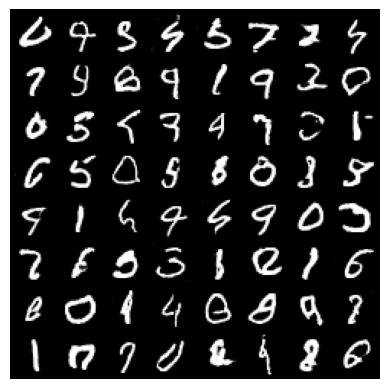

Epoch [27/100], Batch [100/938], D_real: 0.8932, D_fake: 0.0926, Loss_D: 0.2465, Loss_G: 3.5925
Epoch [27/100], Batch [200/938], D_real: 0.7852, D_fake: 0.0152, Loss_D: 0.3063, Loss_G: 5.5023
Epoch [27/100], Batch [300/938], D_real: 0.8558, D_fake: 0.1360, Loss_D: 0.3969, Loss_G: 2.7840
Epoch [27/100], Batch [400/938], D_real: 0.8586, D_fake: 0.1083, Loss_D: 0.3300, Loss_G: 3.3866
Epoch [27/100], Batch [500/938], D_real: 0.9368, D_fake: 0.1541, Loss_D: 0.2868, Loss_G: 3.8478
Epoch [27/100], Batch [600/938], D_real: 0.8901, D_fake: 0.0672, Loss_D: 0.2162, Loss_G: 3.7247
Epoch [27/100], Batch [700/938], D_real: 0.9860, D_fake: 0.5028, Loss_D: 1.0587, Loss_G: 1.9901
Epoch [27/100], Batch [800/938], D_real: 0.8305, D_fake: 0.1324, Loss_D: 0.3947, Loss_G: 3.1860
Epoch [27/100], Batch [900/938], D_real: 0.9512, D_fake: 0.2960, Loss_D: 0.5637, Loss_G: 3.5656


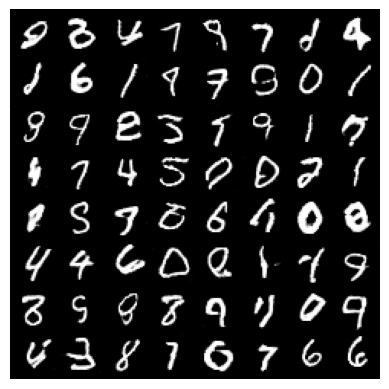

Epoch [28/100], Batch [100/938], D_real: 0.8305, D_fake: 0.0278, Loss_D: 0.2422, Loss_G: 4.1051
Epoch [28/100], Batch [200/938], D_real: 0.8151, D_fake: 0.0212, Loss_D: 0.2681, Loss_G: 4.5215
Epoch [28/100], Batch [300/938], D_real: 0.7191, D_fake: 0.0713, Loss_D: 0.5114, Loss_G: 2.4317
Epoch [28/100], Batch [400/938], D_real: 0.7882, D_fake: 0.1779, Loss_D: 0.5181, Loss_G: 2.2065
Epoch [28/100], Batch [500/938], D_real: 0.9408, D_fake: 0.1890, Loss_D: 0.3307, Loss_G: 3.8869
Epoch [28/100], Batch [600/938], D_real: 0.7752, D_fake: 0.0859, Loss_D: 0.4170, Loss_G: 3.9414
Epoch [28/100], Batch [700/938], D_real: 0.9574, D_fake: 0.2390, Loss_D: 0.4556, Loss_G: 2.0706
Epoch [28/100], Batch [800/938], D_real: 0.9569, D_fake: 0.1829, Loss_D: 0.3080, Loss_G: 2.9023
Epoch [28/100], Batch [900/938], D_real: 0.7226, D_fake: 0.0782, Loss_D: 0.4998, Loss_G: 2.4223


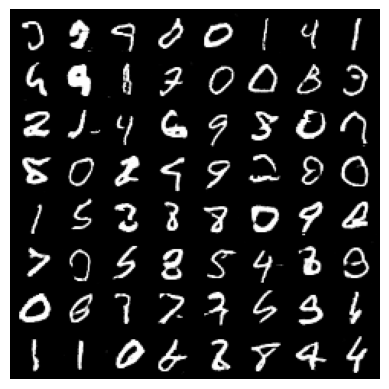

Epoch [29/100], Batch [100/938], D_real: 0.8903, D_fake: 0.0411, Loss_D: 0.1883, Loss_G: 5.4184
Epoch [29/100], Batch [200/938], D_real: 0.8734, D_fake: 0.0838, Loss_D: 0.2537, Loss_G: 3.2868
Epoch [29/100], Batch [300/938], D_real: 0.8889, D_fake: 0.1426, Loss_D: 0.3151, Loss_G: 3.4157
Epoch [29/100], Batch [400/938], D_real: 0.9186, D_fake: 0.1054, Loss_D: 0.2244, Loss_G: 2.6548
Epoch [29/100], Batch [500/938], D_real: 0.7272, D_fake: 0.0612, Loss_D: 0.4835, Loss_G: 3.7678
Epoch [29/100], Batch [600/938], D_real: 0.8321, D_fake: 0.1034, Loss_D: 0.3327, Loss_G: 2.7446
Epoch [29/100], Batch [700/938], D_real: 0.9713, D_fake: 0.1068, Loss_D: 0.1772, Loss_G: 5.0082
Epoch [29/100], Batch [800/938], D_real: 0.8914, D_fake: 0.1174, Loss_D: 0.2960, Loss_G: 2.8121
Epoch [29/100], Batch [900/938], D_real: 0.9417, D_fake: 0.1182, Loss_D: 0.2253, Loss_G: 4.0006


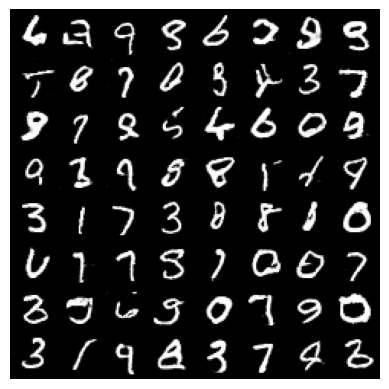

Epoch [30/100], Batch [100/938], D_real: 0.8531, D_fake: 0.1391, Loss_D: 0.3623, Loss_G: 3.6812
Epoch [30/100], Batch [200/938], D_real: 0.6757, D_fake: 0.0421, Loss_D: 0.6450, Loss_G: 3.1333
Epoch [30/100], Batch [300/938], D_real: 0.8963, D_fake: 0.0754, Loss_D: 0.2283, Loss_G: 4.2707
Epoch [30/100], Batch [400/938], D_real: 0.8321, D_fake: 0.0967, Loss_D: 0.3609, Loss_G: 3.7650
Epoch [30/100], Batch [500/938], D_real: 0.8950, D_fake: 0.0236, Loss_D: 0.1554, Loss_G: 4.3935
Epoch [30/100], Batch [600/938], D_real: 0.9001, D_fake: 0.0720, Loss_D: 0.2293, Loss_G: 3.9295
Epoch [30/100], Batch [700/938], D_real: 0.9725, D_fake: 0.4224, Loss_D: 0.7817, Loss_G: 2.8014
Epoch [30/100], Batch [800/938], D_real: 0.8391, D_fake: 0.0115, Loss_D: 0.2138, Loss_G: 6.0138
Epoch [30/100], Batch [900/938], D_real: 0.9218, D_fake: 0.1069, Loss_D: 0.2410, Loss_G: 3.9059


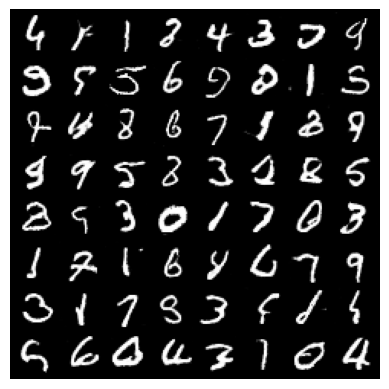

Epoch [31/100], Batch [100/938], D_real: 0.8279, D_fake: 0.0834, Loss_D: 0.3121, Loss_G: 3.8326
Epoch [31/100], Batch [200/938], D_real: 0.9923, D_fake: 0.2874, Loss_D: 0.4389, Loss_G: 2.1608
Epoch [31/100], Batch [300/938], D_real: 0.9339, D_fake: 0.0685, Loss_D: 0.1539, Loss_G: 4.2386
Epoch [31/100], Batch [400/938], D_real: 0.9778, D_fake: 0.2796, Loss_D: 0.4609, Loss_G: 2.6724
Epoch [31/100], Batch [500/938], D_real: 0.8938, D_fake: 0.1160, Loss_D: 0.2725, Loss_G: 3.0585
Epoch [31/100], Batch [600/938], D_real: 0.7734, D_fake: 0.0458, Loss_D: 0.3698, Loss_G: 4.3675
Epoch [31/100], Batch [700/938], D_real: 0.8283, D_fake: 0.0770, Loss_D: 0.3159, Loss_G: 3.4508
Epoch [31/100], Batch [800/938], D_real: 0.8691, D_fake: 0.0909, Loss_D: 0.2759, Loss_G: 3.0081
Epoch [31/100], Batch [900/938], D_real: 0.7681, D_fake: 0.1400, Loss_D: 0.5497, Loss_G: 2.2913


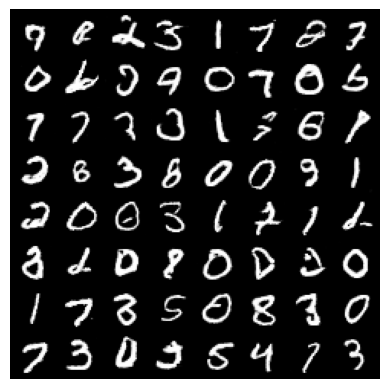

Epoch [32/100], Batch [100/938], D_real: 0.8897, D_fake: 0.2864, Loss_D: 0.5947, Loss_G: 3.1705
Epoch [32/100], Batch [200/938], D_real: 0.8441, D_fake: 0.0538, Loss_D: 0.2509, Loss_G: 3.3914
Epoch [32/100], Batch [300/938], D_real: 0.9661, D_fake: 0.1570, Loss_D: 0.2486, Loss_G: 3.1010
Epoch [32/100], Batch [400/938], D_real: 0.8642, D_fake: 0.0404, Loss_D: 0.2349, Loss_G: 4.7925
Epoch [32/100], Batch [500/938], D_real: 0.7068, D_fake: 0.1015, Loss_D: 0.6118, Loss_G: 2.7246
Epoch [32/100], Batch [600/938], D_real: 0.6639, D_fake: 0.0194, Loss_D: 0.5379, Loss_G: 3.4922
Epoch [32/100], Batch [700/938], D_real: 0.9185, D_fake: 0.2530, Loss_D: 0.4845, Loss_G: 2.8712
Epoch [32/100], Batch [800/938], D_real: 0.5382, D_fake: 0.0294, Loss_D: 0.8544, Loss_G: 2.6608
Epoch [32/100], Batch [900/938], D_real: 0.7067, D_fake: 0.0260, Loss_D: 0.5009, Loss_G: 4.3043


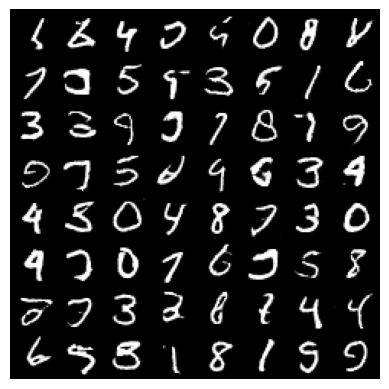

Epoch [33/100], Batch [100/938], D_real: 0.8075, D_fake: 0.0333, Loss_D: 0.2995, Loss_G: 4.3794
Epoch [33/100], Batch [200/938], D_real: 0.9490, D_fake: 0.1679, Loss_D: 0.3092, Loss_G: 3.1207
Epoch [33/100], Batch [300/938], D_real: 0.9214, D_fake: 0.0513, Loss_D: 0.1494, Loss_G: 4.4635
Epoch [33/100], Batch [400/938], D_real: 0.9548, D_fake: 0.0989, Loss_D: 0.1770, Loss_G: 3.9220
Epoch [33/100], Batch [500/938], D_real: 0.9211, D_fake: 0.0420, Loss_D: 0.1348, Loss_G: 4.8924
Epoch [33/100], Batch [600/938], D_real: 0.9611, D_fake: 0.1108, Loss_D: 0.1841, Loss_G: 2.8359
Epoch [33/100], Batch [700/938], D_real: 0.9468, D_fake: 0.1940, Loss_D: 0.3333, Loss_G: 3.4146
Epoch [33/100], Batch [800/938], D_real: 0.8164, D_fake: 0.0422, Loss_D: 0.3104, Loss_G: 5.0381
Epoch [33/100], Batch [900/938], D_real: 0.9814, D_fake: 0.2589, Loss_D: 0.4387, Loss_G: 3.3216


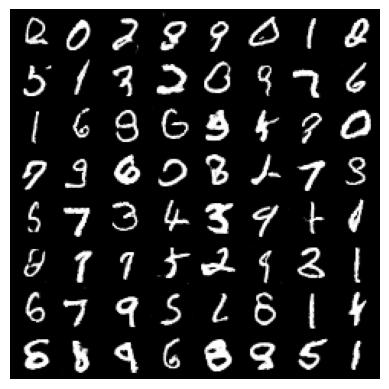

Epoch [34/100], Batch [100/938], D_real: 0.9549, D_fake: 0.1049, Loss_D: 0.1948, Loss_G: 3.0166
Epoch [34/100], Batch [200/938], D_real: 0.9398, D_fake: 0.1574, Loss_D: 0.2658, Loss_G: 1.9936
Epoch [34/100], Batch [300/938], D_real: 0.9806, D_fake: 0.3255, Loss_D: 0.5130, Loss_G: 2.7532
Epoch [34/100], Batch [400/938], D_real: 0.9351, D_fake: 0.1748, Loss_D: 0.3037, Loss_G: 2.5388
Epoch [34/100], Batch [500/938], D_real: 0.8632, D_fake: 0.0606, Loss_D: 0.2346, Loss_G: 3.8773
Epoch [34/100], Batch [600/938], D_real: 0.8300, D_fake: 0.0574, Loss_D: 0.2952, Loss_G: 5.2150
Epoch [34/100], Batch [700/938], D_real: 0.8728, D_fake: 0.0443, Loss_D: 0.2093, Loss_G: 5.0501
Epoch [34/100], Batch [800/938], D_real: 0.9112, D_fake: 0.1548, Loss_D: 0.2979, Loss_G: 2.7807
Epoch [34/100], Batch [900/938], D_real: 0.8554, D_fake: 0.0708, Loss_D: 0.2656, Loss_G: 3.2925


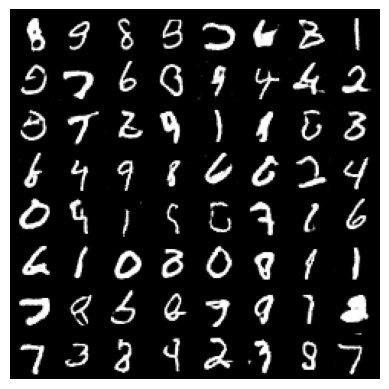

Epoch [35/100], Batch [100/938], D_real: 0.9480, D_fake: 0.0614, Loss_D: 0.1353, Loss_G: 2.9889
Epoch [35/100], Batch [200/938], D_real: 0.7795, D_fake: 0.0044, Loss_D: 0.3114, Loss_G: 6.7192
Epoch [35/100], Batch [300/938], D_real: 0.8139, D_fake: 0.1547, Loss_D: 0.4702, Loss_G: 2.1053
Epoch [35/100], Batch [400/938], D_real: 0.8481, D_fake: 0.3050, Loss_D: 0.6890, Loss_G: 3.5212
Epoch [35/100], Batch [500/938], D_real: 0.9891, D_fake: 0.1292, Loss_D: 0.1876, Loss_G: 4.8138
Epoch [35/100], Batch [600/938], D_real: 0.7808, D_fake: 0.0665, Loss_D: 0.3720, Loss_G: 3.9402
Epoch [35/100], Batch [700/938], D_real: 0.8896, D_fake: 0.0521, Loss_D: 0.1870, Loss_G: 3.8347
Epoch [35/100], Batch [800/938], D_real: 0.9256, D_fake: 0.1067, Loss_D: 0.2389, Loss_G: 2.8448
Epoch [35/100], Batch [900/938], D_real: 0.9162, D_fake: 0.0652, Loss_D: 0.1805, Loss_G: 5.4105


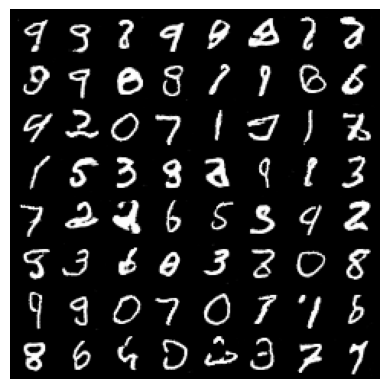

Epoch [36/100], Batch [100/938], D_real: 0.9718, D_fake: 0.0816, Loss_D: 0.1430, Loss_G: 4.7933
Epoch [36/100], Batch [200/938], D_real: 0.8858, D_fake: 0.1018, Loss_D: 0.2758, Loss_G: 3.4521
Epoch [36/100], Batch [300/938], D_real: 0.7376, D_fake: 0.0570, Loss_D: 0.4770, Loss_G: 2.2889
Epoch [36/100], Batch [400/938], D_real: 0.8189, D_fake: 0.0161, Loss_D: 0.2648, Loss_G: 5.3766
Epoch [36/100], Batch [500/938], D_real: 0.7594, D_fake: 0.0226, Loss_D: 0.3663, Loss_G: 5.3580
Epoch [36/100], Batch [600/938], D_real: 0.7429, D_fake: 0.0348, Loss_D: 0.4179, Loss_G: 4.1324
Epoch [36/100], Batch [700/938], D_real: 0.9484, D_fake: 0.1087, Loss_D: 0.2025, Loss_G: 3.5428
Epoch [36/100], Batch [800/938], D_real: 0.9829, D_fake: 0.2567, Loss_D: 0.4296, Loss_G: 2.2012
Epoch [36/100], Batch [900/938], D_real: 0.9532, D_fake: 0.3008, Loss_D: 0.5327, Loss_G: 2.1906


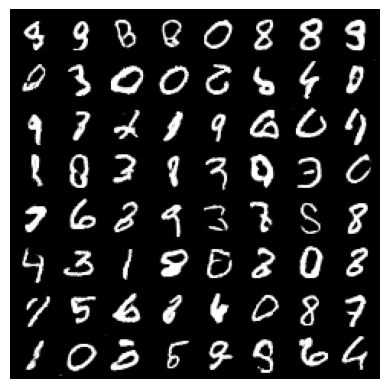

Epoch [37/100], Batch [100/938], D_real: 0.8591, D_fake: 0.1174, Loss_D: 0.3340, Loss_G: 3.5872
Epoch [37/100], Batch [200/938], D_real: 0.8331, D_fake: 0.0177, Loss_D: 0.2238, Loss_G: 4.5825
Epoch [37/100], Batch [300/938], D_real: 0.9197, D_fake: 0.0745, Loss_D: 0.1781, Loss_G: 2.5873
Epoch [37/100], Batch [400/938], D_real: 0.9076, D_fake: 0.1493, Loss_D: 0.2942, Loss_G: 3.1073
Epoch [37/100], Batch [500/938], D_real: 0.7284, D_fake: 0.0448, Loss_D: 0.4875, Loss_G: 3.3173
Epoch [37/100], Batch [600/938], D_real: 0.8618, D_fake: 0.1062, Loss_D: 0.3153, Loss_G: 3.2155
Epoch [37/100], Batch [700/938], D_real: 0.9538, D_fake: 0.1217, Loss_D: 0.2069, Loss_G: 4.1124
Epoch [37/100], Batch [800/938], D_real: 0.9283, D_fake: 0.1524, Loss_D: 0.2774, Loss_G: 3.4515
Epoch [37/100], Batch [900/938], D_real: 0.8441, D_fake: 0.0261, Loss_D: 0.2153, Loss_G: 5.8858


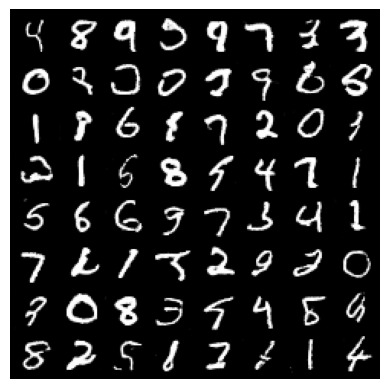

Epoch [38/100], Batch [100/938], D_real: 0.9490, D_fake: 0.1556, Loss_D: 0.2500, Loss_G: 2.5705
Epoch [38/100], Batch [200/938], D_real: 0.9727, D_fake: 0.2353, Loss_D: 0.3895, Loss_G: 2.1989
Epoch [38/100], Batch [300/938], D_real: 0.9494, D_fake: 0.1366, Loss_D: 0.2343, Loss_G: 4.1659
Epoch [38/100], Batch [400/938], D_real: 0.9800, D_fake: 0.2164, Loss_D: 0.3485, Loss_G: 2.1990
Epoch [38/100], Batch [500/938], D_real: 0.9379, D_fake: 0.1492, Loss_D: 0.2957, Loss_G: 4.0853
Epoch [38/100], Batch [600/938], D_real: 0.8875, D_fake: 0.1074, Loss_D: 0.2629, Loss_G: 2.5673
Epoch [38/100], Batch [700/938], D_real: 0.8611, D_fake: 0.0740, Loss_D: 0.2737, Loss_G: 3.5340
Epoch [38/100], Batch [800/938], D_real: 0.9444, D_fake: 0.1497, Loss_D: 0.2906, Loss_G: 3.2276
Epoch [38/100], Batch [900/938], D_real: 0.9630, D_fake: 0.1360, Loss_D: 0.2276, Loss_G: 3.4862


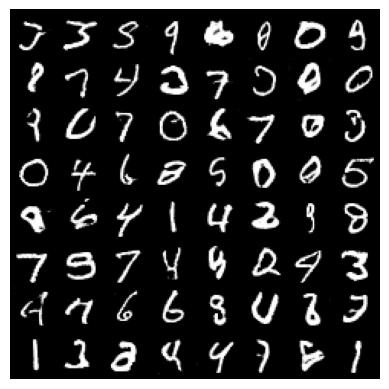

Epoch [39/100], Batch [100/938], D_real: 0.8523, D_fake: 0.0413, Loss_D: 0.2258, Loss_G: 3.7761
Epoch [39/100], Batch [200/938], D_real: 0.8154, D_fake: 0.0520, Loss_D: 0.3020, Loss_G: 2.8663
Epoch [39/100], Batch [300/938], D_real: 0.9400, D_fake: 0.1465, Loss_D: 0.2454, Loss_G: 3.2165
Epoch [39/100], Batch [400/938], D_real: 0.8163, D_fake: 0.0659, Loss_D: 0.3109, Loss_G: 4.4730
Epoch [39/100], Batch [500/938], D_real: 0.9508, D_fake: 0.2300, Loss_D: 0.3761, Loss_G: 2.8556
Epoch [39/100], Batch [600/938], D_real: 0.8601, D_fake: 0.0332, Loss_D: 0.2180, Loss_G: 4.2704
Epoch [39/100], Batch [700/938], D_real: 0.9427, D_fake: 0.1343, Loss_D: 0.2660, Loss_G: 2.8841
Epoch [39/100], Batch [800/938], D_real: 0.8822, D_fake: 0.0400, Loss_D: 0.1941, Loss_G: 3.5391
Epoch [39/100], Batch [900/938], D_real: 0.8651, D_fake: 0.0370, Loss_D: 0.2115, Loss_G: 4.8139


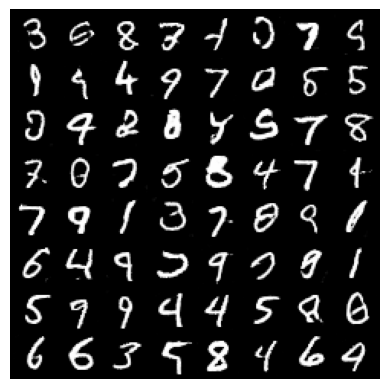

Epoch [40/100], Batch [100/938], D_real: 0.9073, D_fake: 0.1723, Loss_D: 0.3514, Loss_G: 3.8180
Epoch [40/100], Batch [200/938], D_real: 0.9574, D_fake: 0.1110, Loss_D: 0.1945, Loss_G: 3.7508
Epoch [40/100], Batch [300/938], D_real: 0.8969, D_fake: 0.2646, Loss_D: 0.5074, Loss_G: 2.4701
Epoch [40/100], Batch [400/938], D_real: 0.9693, D_fake: 0.2017, Loss_D: 0.3408, Loss_G: 2.9902
Epoch [40/100], Batch [500/938], D_real: 0.5188, D_fake: 0.0204, Loss_D: 0.9166, Loss_G: 4.7186
Epoch [40/100], Batch [600/938], D_real: 0.9118, D_fake: 0.1717, Loss_D: 0.3286, Loss_G: 1.7940
Epoch [40/100], Batch [700/938], D_real: 0.7599, D_fake: 0.0360, Loss_D: 0.3812, Loss_G: 3.4053
Epoch [40/100], Batch [800/938], D_real: 0.8239, D_fake: 0.0463, Loss_D: 0.2787, Loss_G: 4.1997
Epoch [40/100], Batch [900/938], D_real: 0.9195, D_fake: 0.2123, Loss_D: 0.3840, Loss_G: 2.9212


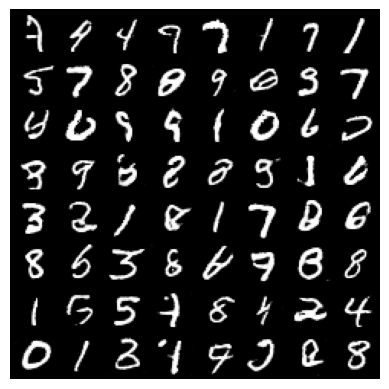

Epoch [41/100], Batch [100/938], D_real: 0.9107, D_fake: 0.0877, Loss_D: 0.2032, Loss_G: 2.9422
Epoch [41/100], Batch [200/938], D_real: 0.9348, D_fake: 0.2227, Loss_D: 0.4662, Loss_G: 3.5895
Epoch [41/100], Batch [300/938], D_real: 0.8730, D_fake: 0.1569, Loss_D: 0.3938, Loss_G: 2.7299
Epoch [41/100], Batch [400/938], D_real: 0.7181, D_fake: 0.0418, Loss_D: 0.4888, Loss_G: 3.6783
Epoch [41/100], Batch [500/938], D_real: 0.8324, D_fake: 0.0401, Loss_D: 0.2900, Loss_G: 3.2431
Epoch [41/100], Batch [600/938], D_real: 0.9715, D_fake: 0.2855, Loss_D: 0.4588, Loss_G: 2.9822
Epoch [41/100], Batch [700/938], D_real: 0.7869, D_fake: 0.0321, Loss_D: 0.3316, Loss_G: 4.9455
Epoch [41/100], Batch [800/938], D_real: 0.8618, D_fake: 0.0725, Loss_D: 0.2719, Loss_G: 5.3406
Epoch [41/100], Batch [900/938], D_real: 0.6915, D_fake: 0.0506, Loss_D: 0.5591, Loss_G: 3.5667


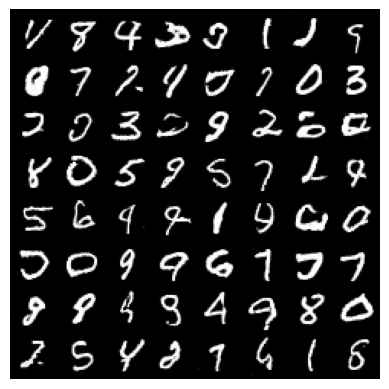

Epoch [42/100], Batch [100/938], D_real: 0.9288, D_fake: 0.0114, Loss_D: 0.0903, Loss_G: 6.2057
Epoch [42/100], Batch [200/938], D_real: 0.9944, D_fake: 0.4507, Loss_D: 0.8730, Loss_G: 2.5491
Epoch [42/100], Batch [300/938], D_real: 0.9477, D_fake: 0.0628, Loss_D: 0.1395, Loss_G: 4.2538
Epoch [42/100], Batch [400/938], D_real: 0.8333, D_fake: 0.1439, Loss_D: 0.4057, Loss_G: 3.1090
Epoch [42/100], Batch [500/938], D_real: 0.9689, D_fake: 0.1441, Loss_D: 0.2239, Loss_G: 3.1067
Epoch [42/100], Batch [600/938], D_real: 0.9723, D_fake: 0.1404, Loss_D: 0.2571, Loss_G: 3.5831
Epoch [42/100], Batch [700/938], D_real: 0.8609, D_fake: 0.0658, Loss_D: 0.2671, Loss_G: 3.6142
Epoch [42/100], Batch [800/938], D_real: 0.9748, D_fake: 0.2503, Loss_D: 0.3987, Loss_G: 2.8383
Epoch [42/100], Batch [900/938], D_real: 0.7076, D_fake: 0.0891, Loss_D: 0.5603, Loss_G: 3.4116


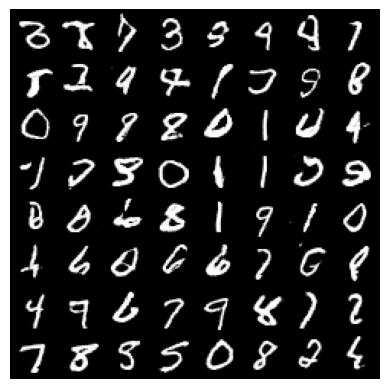

Epoch [43/100], Batch [100/938], D_real: 0.9363, D_fake: 0.0470, Loss_D: 0.1282, Loss_G: 5.0887
Epoch [43/100], Batch [200/938], D_real: 0.7896, D_fake: 0.0307, Loss_D: 0.3389, Loss_G: 2.7434
Epoch [43/100], Batch [300/938], D_real: 0.9771, D_fake: 0.2037, Loss_D: 0.3191, Loss_G: 2.7647
Epoch [43/100], Batch [400/938], D_real: 0.8732, D_fake: 0.0394, Loss_D: 0.1973, Loss_G: 3.9159
Epoch [43/100], Batch [500/938], D_real: 0.9839, D_fake: 0.2313, Loss_D: 0.3698, Loss_G: 2.8016
Epoch [43/100], Batch [600/938], D_real: 0.9687, D_fake: 0.1630, Loss_D: 0.2439, Loss_G: 1.9233
Epoch [43/100], Batch [700/938], D_real: 0.7310, D_fake: 0.0445, Loss_D: 0.4254, Loss_G: 3.4578
Epoch [43/100], Batch [800/938], D_real: 0.9287, D_fake: 0.1308, Loss_D: 0.2522, Loss_G: 3.6349
Epoch [43/100], Batch [900/938], D_real: 0.8483, D_fake: 0.0290, Loss_D: 0.2284, Loss_G: 3.6639


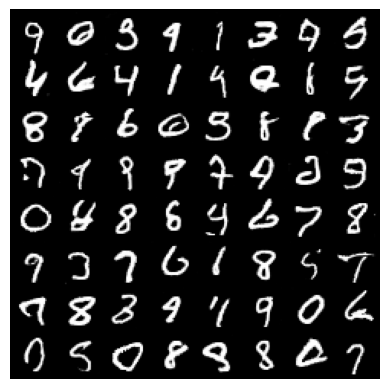

Epoch [44/100], Batch [100/938], D_real: 0.8652, D_fake: 0.0257, Loss_D: 0.1972, Loss_G: 5.6282
Epoch [44/100], Batch [200/938], D_real: 0.9791, D_fake: 0.2835, Loss_D: 0.4829, Loss_G: 3.6860
Epoch [44/100], Batch [300/938], D_real: 0.8656, D_fake: 0.0262, Loss_D: 0.2090, Loss_G: 5.2904
Epoch [44/100], Batch [400/938], D_real: 0.9272, D_fake: 0.2027, Loss_D: 0.3722, Loss_G: 1.8170
Epoch [44/100], Batch [500/938], D_real: 0.9912, D_fake: 0.2666, Loss_D: 0.4326, Loss_G: 2.1897
Epoch [44/100], Batch [600/938], D_real: 0.6613, D_fake: 0.0114, Loss_D: 0.5135, Loss_G: 5.9938
Epoch [44/100], Batch [700/938], D_real: 0.9262, D_fake: 0.1762, Loss_D: 0.3514, Loss_G: 2.3894
Epoch [44/100], Batch [800/938], D_real: 0.8775, D_fake: 0.1220, Loss_D: 0.3397, Loss_G: 2.0089
Epoch [44/100], Batch [900/938], D_real: 0.9828, D_fake: 0.2649, Loss_D: 0.4188, Loss_G: 2.5567


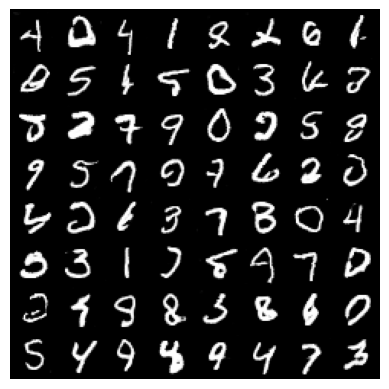

Epoch [45/100], Batch [100/938], D_real: 0.9210, D_fake: 0.2265, Loss_D: 0.3925, Loss_G: 2.3157
Epoch [45/100], Batch [200/938], D_real: 0.9294, D_fake: 0.0369, Loss_D: 0.1178, Loss_G: 4.5025
Epoch [45/100], Batch [300/938], D_real: 0.8009, D_fake: 0.0613, Loss_D: 0.3338, Loss_G: 4.4687
Epoch [45/100], Batch [400/938], D_real: 0.8953, D_fake: 0.2131, Loss_D: 0.4194, Loss_G: 2.6472
Epoch [45/100], Batch [500/938], D_real: 0.9458, D_fake: 0.0753, Loss_D: 0.1523, Loss_G: 3.6248
Epoch [45/100], Batch [600/938], D_real: 0.9581, D_fake: 0.2983, Loss_D: 0.5580, Loss_G: 1.8545
Epoch [45/100], Batch [700/938], D_real: 0.9103, D_fake: 0.1296, Loss_D: 0.2896, Loss_G: 2.6068
Epoch [45/100], Batch [800/938], D_real: 0.9054, D_fake: 0.0857, Loss_D: 0.2280, Loss_G: 3.5592
Epoch [45/100], Batch [900/938], D_real: 0.7047, D_fake: 0.0615, Loss_D: 0.5133, Loss_G: 3.0582


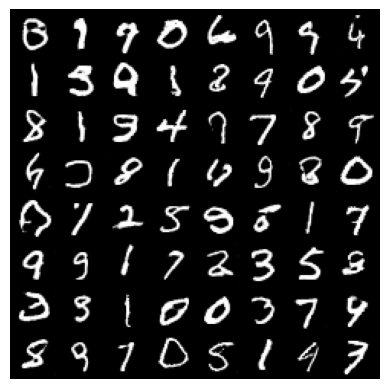

Epoch [46/100], Batch [100/938], D_real: 0.9207, D_fake: 0.0359, Loss_D: 0.1305, Loss_G: 3.6315
Epoch [46/100], Batch [200/938], D_real: 0.9554, D_fake: 0.0578, Loss_D: 0.1153, Loss_G: 3.5995
Epoch [46/100], Batch [300/938], D_real: 0.9546, D_fake: 0.0894, Loss_D: 0.1587, Loss_G: 2.0956
Epoch [46/100], Batch [400/938], D_real: 0.8300, D_fake: 0.0598, Loss_D: 0.3000, Loss_G: 4.4943
Epoch [46/100], Batch [500/938], D_real: 0.9852, D_fake: 0.1926, Loss_D: 0.3163, Loss_G: 2.8491
Epoch [46/100], Batch [600/938], D_real: 0.9110, D_fake: 0.1797, Loss_D: 0.3900, Loss_G: 3.4250
Epoch [46/100], Batch [700/938], D_real: 0.9444, D_fake: 0.0748, Loss_D: 0.1486, Loss_G: 3.4999
Epoch [46/100], Batch [800/938], D_real: 0.8958, D_fake: 0.0739, Loss_D: 0.2059, Loss_G: 4.1400
Epoch [46/100], Batch [900/938], D_real: 0.9116, D_fake: 0.0939, Loss_D: 0.2298, Loss_G: 3.6660


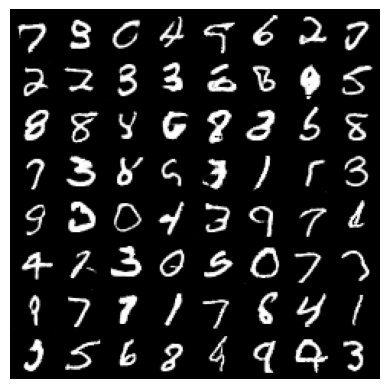

Epoch [47/100], Batch [100/938], D_real: 0.8872, D_fake: 0.0744, Loss_D: 0.2345, Loss_G: 3.9933
Epoch [47/100], Batch [200/938], D_real: 0.9871, D_fake: 0.3801, Loss_D: 0.7475, Loss_G: 1.8460
Epoch [47/100], Batch [300/938], D_real: 0.9428, D_fake: 0.0683, Loss_D: 0.1437, Loss_G: 3.5481
Epoch [47/100], Batch [400/938], D_real: 0.8904, D_fake: 0.0960, Loss_D: 0.2548, Loss_G: 3.4168
Epoch [47/100], Batch [500/938], D_real: 0.7982, D_fake: 0.0351, Loss_D: 0.3480, Loss_G: 4.2521
Epoch [47/100], Batch [600/938], D_real: 0.9026, D_fake: 0.0230, Loss_D: 0.1466, Loss_G: 5.2783
Epoch [47/100], Batch [700/938], D_real: 0.9589, D_fake: 0.2063, Loss_D: 0.3746, Loss_G: 2.6332
Epoch [47/100], Batch [800/938], D_real: 0.7359, D_fake: 0.1061, Loss_D: 0.5295, Loss_G: 3.2788
Epoch [47/100], Batch [900/938], D_real: 0.8524, D_fake: 0.0746, Loss_D: 0.2736, Loss_G: 3.0567


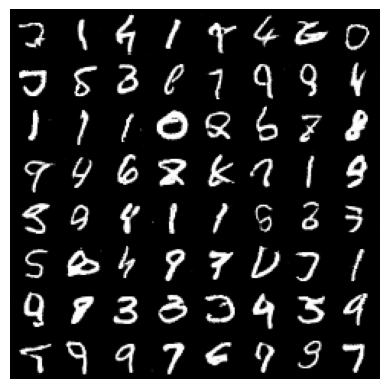

Epoch [48/100], Batch [100/938], D_real: 0.9812, D_fake: 0.1895, Loss_D: 0.2962, Loss_G: 2.9330
Epoch [48/100], Batch [200/938], D_real: 0.9228, D_fake: 0.1091, Loss_D: 0.2377, Loss_G: 3.4924
Epoch [48/100], Batch [300/938], D_real: 0.9658, D_fake: 0.0794, Loss_D: 0.1328, Loss_G: 3.8351
Epoch [48/100], Batch [400/938], D_real: 0.6873, D_fake: 0.0480, Loss_D: 0.6017, Loss_G: 2.6678
Epoch [48/100], Batch [500/938], D_real: 0.9805, D_fake: 0.2090, Loss_D: 0.3450, Loss_G: 3.4143
Epoch [48/100], Batch [600/938], D_real: 0.9500, D_fake: 0.1188, Loss_D: 0.2234, Loss_G: 3.8055
Epoch [48/100], Batch [700/938], D_real: 0.8855, D_fake: 0.0509, Loss_D: 0.2000, Loss_G: 3.7338
Epoch [48/100], Batch [800/938], D_real: 0.9534, D_fake: 0.0696, Loss_D: 0.1409, Loss_G: 2.5936
Epoch [48/100], Batch [900/938], D_real: 0.9645, D_fake: 0.2251, Loss_D: 0.3756, Loss_G: 2.8112


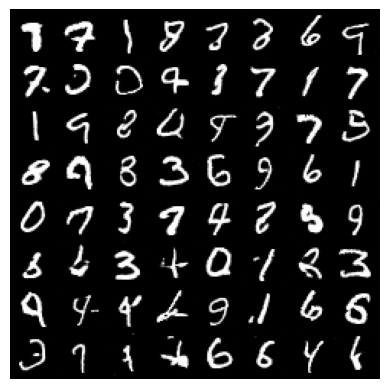

Epoch [49/100], Batch [100/938], D_real: 0.8846, D_fake: 0.0283, Loss_D: 0.1709, Loss_G: 4.0953
Epoch [49/100], Batch [200/938], D_real: 0.8154, D_fake: 0.0395, Loss_D: 0.2804, Loss_G: 2.6900
Epoch [49/100], Batch [300/938], D_real: 0.9323, D_fake: 0.0567, Loss_D: 0.1471, Loss_G: 4.2954
Epoch [49/100], Batch [400/938], D_real: 0.9622, D_fake: 0.2541, Loss_D: 0.4995, Loss_G: 3.3471
Epoch [49/100], Batch [500/938], D_real: 0.7123, D_fake: 0.0441, Loss_D: 0.5266, Loss_G: 4.2783
Epoch [49/100], Batch [600/938], D_real: 0.9631, D_fake: 0.1858, Loss_D: 0.2878, Loss_G: 2.4031
Epoch [49/100], Batch [700/938], D_real: 0.9918, D_fake: 0.4426, Loss_D: 0.8981, Loss_G: 2.1504
Epoch [49/100], Batch [800/938], D_real: 0.9581, D_fake: 0.0594, Loss_D: 0.1154, Loss_G: 2.8282
Epoch [49/100], Batch [900/938], D_real: 0.9437, D_fake: 0.0466, Loss_D: 0.1167, Loss_G: 4.2321


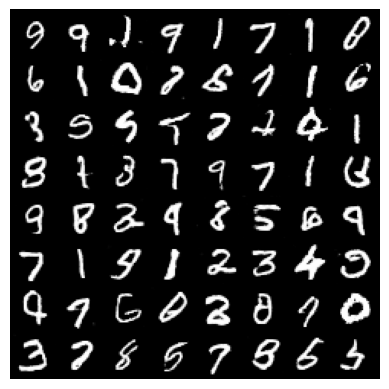

Epoch [50/100], Batch [100/938], D_real: 0.8801, D_fake: 0.0272, Loss_D: 0.1701, Loss_G: 5.3731
Epoch [50/100], Batch [200/938], D_real: 0.9539, D_fake: 0.0655, Loss_D: 0.1232, Loss_G: 4.3833
Epoch [50/100], Batch [300/938], D_real: 0.8732, D_fake: 0.0388, Loss_D: 0.2143, Loss_G: 4.2333
Epoch [50/100], Batch [400/938], D_real: 0.9683, D_fake: 0.0813, Loss_D: 0.1326, Loss_G: 3.9187
Epoch [50/100], Batch [500/938], D_real: 0.9687, D_fake: 0.2924, Loss_D: 0.5160, Loss_G: 2.2820
Epoch [50/100], Batch [600/938], D_real: 0.7149, D_fake: 0.0160, Loss_D: 0.4566, Loss_G: 5.9107
Epoch [50/100], Batch [700/938], D_real: 0.9548, D_fake: 0.1266, Loss_D: 0.2108, Loss_G: 3.5856
Epoch [50/100], Batch [800/938], D_real: 0.9065, D_fake: 0.1127, Loss_D: 0.2622, Loss_G: 4.1264
Epoch [50/100], Batch [900/938], D_real: 0.9462, D_fake: 0.0889, Loss_D: 0.1832, Loss_G: 4.1329


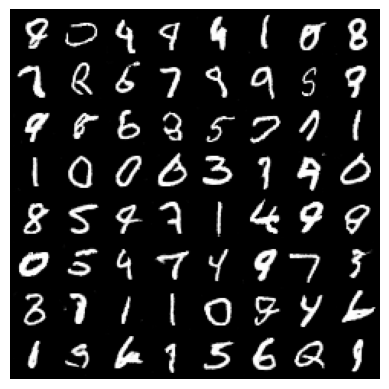

Epoch [51/100], Batch [100/938], D_real: 0.9690, D_fake: 0.1755, Loss_D: 0.2906, Loss_G: 3.5128
Epoch [51/100], Batch [200/938], D_real: 0.9696, D_fake: 0.1731, Loss_D: 0.2911, Loss_G: 4.7773
Epoch [51/100], Batch [300/938], D_real: 0.9909, D_fake: 0.1737, Loss_D: 0.3049, Loss_G: 2.4923
Epoch [51/100], Batch [400/938], D_real: 0.9182, D_fake: 0.0783, Loss_D: 0.1948, Loss_G: 4.2356
Epoch [51/100], Batch [500/938], D_real: 0.8855, D_fake: 0.1814, Loss_D: 0.3959, Loss_G: 3.2613
Epoch [51/100], Batch [600/938], D_real: 0.9198, D_fake: 0.1136, Loss_D: 0.2396, Loss_G: 4.2281
Epoch [51/100], Batch [700/938], D_real: 0.8295, D_fake: 0.0657, Loss_D: 0.3699, Loss_G: 3.6378
Epoch [51/100], Batch [800/938], D_real: 0.8123, D_fake: 0.0460, Loss_D: 0.3439, Loss_G: 2.9103
Epoch [51/100], Batch [900/938], D_real: 0.9816, D_fake: 0.1421, Loss_D: 0.1922, Loss_G: 3.3719


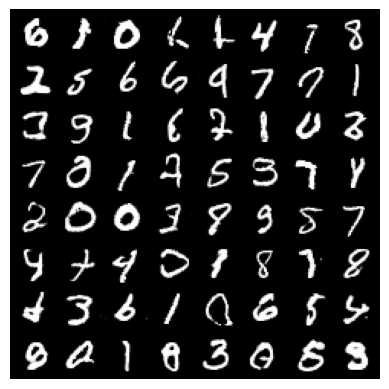

Epoch [52/100], Batch [100/938], D_real: 0.9344, D_fake: 0.0336, Loss_D: 0.1071, Loss_G: 4.1627
Epoch [52/100], Batch [200/938], D_real: 0.8915, D_fake: 0.1425, Loss_D: 0.3229, Loss_G: 3.5381
Epoch [52/100], Batch [300/938], D_real: 0.9793, D_fake: 0.2623, Loss_D: 0.4249, Loss_G: 2.9520
Epoch [52/100], Batch [400/938], D_real: 0.8940, D_fake: 0.0785, Loss_D: 0.2166, Loss_G: 4.0942
Epoch [52/100], Batch [500/938], D_real: 0.9140, D_fake: 0.0372, Loss_D: 0.1473, Loss_G: 4.8178
Epoch [52/100], Batch [600/938], D_real: 0.8499, D_fake: 0.0300, Loss_D: 0.2188, Loss_G: 3.3912
Epoch [52/100], Batch [700/938], D_real: 0.9607, D_fake: 0.1080, Loss_D: 0.1765, Loss_G: 2.8988
Epoch [52/100], Batch [800/938], D_real: 0.8953, D_fake: 0.0631, Loss_D: 0.2159, Loss_G: 3.0056
Epoch [52/100], Batch [900/938], D_real: 0.9182, D_fake: 0.0809, Loss_D: 0.1971, Loss_G: 3.8401


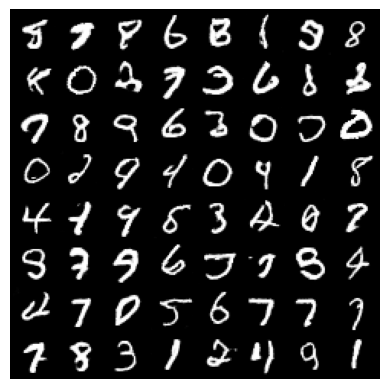

Epoch [53/100], Batch [100/938], D_real: 0.9338, D_fake: 0.0696, Loss_D: 0.1670, Loss_G: 4.0928
Epoch [53/100], Batch [200/938], D_real: 0.8466, D_fake: 0.0206, Loss_D: 0.2290, Loss_G: 5.4965
Epoch [53/100], Batch [300/938], D_real: 0.6906, D_fake: 0.0284, Loss_D: 0.5434, Loss_G: 4.2240
Epoch [53/100], Batch [400/938], D_real: 0.8823, D_fake: 0.1337, Loss_D: 0.3281, Loss_G: 3.5664
Epoch [53/100], Batch [500/938], D_real: 0.9417, D_fake: 0.1218, Loss_D: 0.2298, Loss_G: 3.1460
Epoch [53/100], Batch [600/938], D_real: 0.8646, D_fake: 0.0614, Loss_D: 0.2377, Loss_G: 3.2006
Epoch [53/100], Batch [700/938], D_real: 0.9591, D_fake: 0.2769, Loss_D: 0.4878, Loss_G: 3.0841
Epoch [53/100], Batch [800/938], D_real: 0.9905, D_fake: 0.2109, Loss_D: 0.3234, Loss_G: 3.0557
Epoch [53/100], Batch [900/938], D_real: 0.9177, D_fake: 0.0680, Loss_D: 0.1777, Loss_G: 4.0399


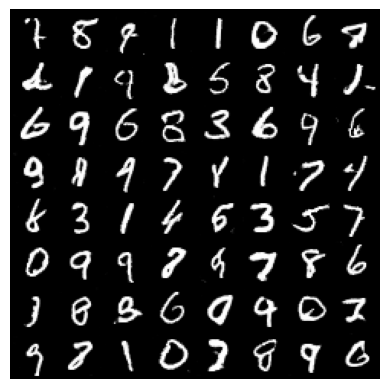

Epoch [54/100], Batch [100/938], D_real: 0.8557, D_fake: 0.0398, Loss_D: 0.2283, Loss_G: 4.9952
Epoch [54/100], Batch [200/938], D_real: 0.9635, D_fake: 0.0982, Loss_D: 0.1552, Loss_G: 3.3235
Epoch [54/100], Batch [300/938], D_real: 0.8939, D_fake: 0.1341, Loss_D: 0.3271, Loss_G: 2.5911
Epoch [54/100], Batch [400/938], D_real: 0.9347, D_fake: 0.1083, Loss_D: 0.2064, Loss_G: 4.0621
Epoch [54/100], Batch [500/938], D_real: 0.9583, D_fake: 0.1758, Loss_D: 0.2952, Loss_G: 2.5597
Epoch [54/100], Batch [600/938], D_real: 0.9959, D_fake: 0.3015, Loss_D: 0.5135, Loss_G: 3.3059
Epoch [54/100], Batch [700/938], D_real: 0.9591, D_fake: 0.1171, Loss_D: 0.2167, Loss_G: 4.2650
Epoch [54/100], Batch [800/938], D_real: 0.8368, D_fake: 0.1201, Loss_D: 0.4095, Loss_G: 3.9384
Epoch [54/100], Batch [900/938], D_real: 0.9885, D_fake: 0.2787, Loss_D: 0.4657, Loss_G: 3.8335


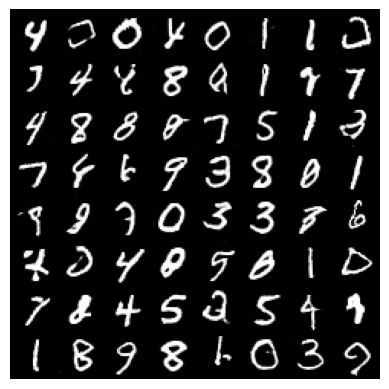

Epoch [55/100], Batch [100/938], D_real: 0.8989, D_fake: 0.1074, Loss_D: 0.2663, Loss_G: 2.5521
Epoch [55/100], Batch [200/938], D_real: 0.8867, D_fake: 0.1088, Loss_D: 0.3095, Loss_G: 3.5347
Epoch [55/100], Batch [300/938], D_real: 0.9558, D_fake: 0.1451, Loss_D: 0.2521, Loss_G: 3.3738
Epoch [55/100], Batch [400/938], D_real: 0.9897, D_fake: 0.2243, Loss_D: 0.3444, Loss_G: 2.3633
Epoch [55/100], Batch [500/938], D_real: 0.9771, D_fake: 0.1502, Loss_D: 0.2348, Loss_G: 2.1576
Epoch [55/100], Batch [600/938], D_real: 0.9902, D_fake: 0.1769, Loss_D: 0.2598, Loss_G: 2.7766
Epoch [55/100], Batch [700/938], D_real: 0.9373, D_fake: 0.0678, Loss_D: 0.1513, Loss_G: 5.1608
Epoch [55/100], Batch [800/938], D_real: 0.9863, D_fake: 0.3045, Loss_D: 0.5247, Loss_G: 1.7514
Epoch [55/100], Batch [900/938], D_real: 0.9843, D_fake: 0.1399, Loss_D: 0.2121, Loss_G: 3.1985


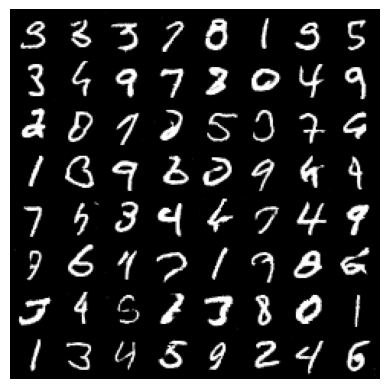

Epoch [56/100], Batch [100/938], D_real: 0.6899, D_fake: 0.0084, Loss_D: 0.4961, Loss_G: 4.8327
Epoch [56/100], Batch [200/938], D_real: 0.7757, D_fake: 0.0439, Loss_D: 0.3707, Loss_G: 3.8263
Epoch [56/100], Batch [300/938], D_real: 0.9551, D_fake: 0.1502, Loss_D: 0.2482, Loss_G: 3.4067
Epoch [56/100], Batch [400/938], D_real: 0.8284, D_fake: 0.0200, Loss_D: 0.2450, Loss_G: 4.2599
Epoch [56/100], Batch [500/938], D_real: 0.7803, D_fake: 0.0443, Loss_D: 0.3839, Loss_G: 4.9925
Epoch [56/100], Batch [600/938], D_real: 0.5995, D_fake: 0.0140, Loss_D: 0.7382, Loss_G: 4.0835
Epoch [56/100], Batch [700/938], D_real: 0.8502, D_fake: 0.0181, Loss_D: 0.2294, Loss_G: 4.5286
Epoch [56/100], Batch [800/938], D_real: 0.9090, D_fake: 0.0967, Loss_D: 0.2588, Loss_G: 3.4875
Epoch [56/100], Batch [900/938], D_real: 0.7860, D_fake: 0.1348, Loss_D: 0.4718, Loss_G: 2.8483


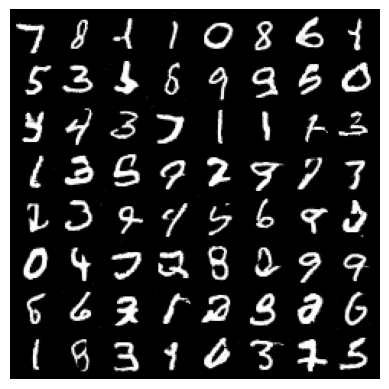

Epoch [57/100], Batch [100/938], D_real: 0.9241, D_fake: 0.1241, Loss_D: 0.2366, Loss_G: 2.5875
Epoch [57/100], Batch [200/938], D_real: 0.7960, D_fake: 0.0149, Loss_D: 0.2849, Loss_G: 4.2529
Epoch [57/100], Batch [300/938], D_real: 0.8691, D_fake: 0.0655, Loss_D: 0.2531, Loss_G: 3.1646
Epoch [57/100], Batch [400/938], D_real: 0.7636, D_fake: 0.0203, Loss_D: 0.3579, Loss_G: 5.5093
Epoch [57/100], Batch [500/938], D_real: 0.8824, D_fake: 0.0270, Loss_D: 0.1738, Loss_G: 4.7372
Epoch [57/100], Batch [600/938], D_real: 0.8294, D_fake: 0.0507, Loss_D: 0.2813, Loss_G: 4.6605
Epoch [57/100], Batch [700/938], D_real: 0.9489, D_fake: 0.0971, Loss_D: 0.1775, Loss_G: 2.9289
Epoch [57/100], Batch [800/938], D_real: 0.9703, D_fake: 0.0719, Loss_D: 0.1248, Loss_G: 4.2076
Epoch [57/100], Batch [900/938], D_real: 0.8164, D_fake: 0.0619, Loss_D: 0.3176, Loss_G: 3.6125


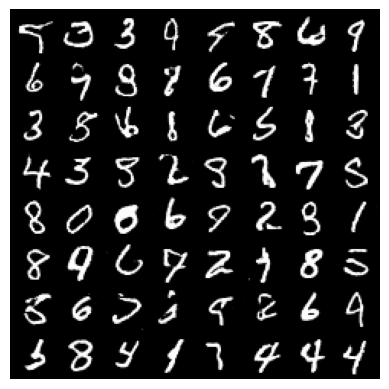

Epoch [58/100], Batch [100/938], D_real: 0.9526, D_fake: 0.1354, Loss_D: 0.2248, Loss_G: 4.5182
Epoch [58/100], Batch [200/938], D_real: 0.8764, D_fake: 0.0607, Loss_D: 0.2391, Loss_G: 3.8416
Epoch [58/100], Batch [300/938], D_real: 0.9817, D_fake: 0.1292, Loss_D: 0.1836, Loss_G: 2.7347
Epoch [58/100], Batch [400/938], D_real: 0.8099, D_fake: 0.0289, Loss_D: 0.2977, Loss_G: 5.0606
Epoch [58/100], Batch [500/938], D_real: 0.7508, D_fake: 0.0439, Loss_D: 0.4038, Loss_G: 3.9208
Epoch [58/100], Batch [600/938], D_real: 0.8668, D_fake: 0.0317, Loss_D: 0.1985, Loss_G: 3.8045
Epoch [58/100], Batch [700/938], D_real: 0.8570, D_fake: 0.0422, Loss_D: 0.2317, Loss_G: 4.4568
Epoch [58/100], Batch [800/938], D_real: 0.9249, D_fake: 0.0912, Loss_D: 0.1986, Loss_G: 3.8468
Epoch [58/100], Batch [900/938], D_real: 0.9404, D_fake: 0.0875, Loss_D: 0.1722, Loss_G: 3.8916


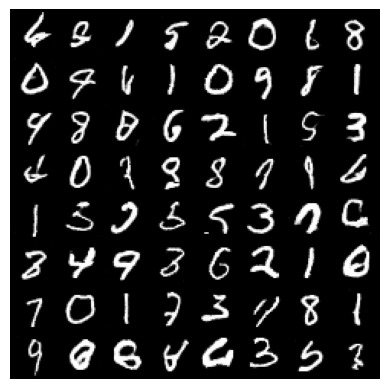

Epoch [59/100], Batch [100/938], D_real: 0.9921, D_fake: 0.4630, Loss_D: 1.0868, Loss_G: 2.2687
Epoch [59/100], Batch [200/938], D_real: 0.9188, D_fake: 0.0524, Loss_D: 0.1597, Loss_G: 3.7690
Epoch [59/100], Batch [300/938], D_real: 0.9162, D_fake: 0.0571, Loss_D: 0.1654, Loss_G: 4.0770
Epoch [59/100], Batch [400/938], D_real: 0.9720, D_fake: 0.1039, Loss_D: 0.1692, Loss_G: 4.2611
Epoch [59/100], Batch [500/938], D_real: 0.8071, D_fake: 0.0672, Loss_D: 0.3665, Loss_G: 3.9913
Epoch [59/100], Batch [600/938], D_real: 0.8192, D_fake: 0.0287, Loss_D: 0.3074, Loss_G: 4.9000
Epoch [59/100], Batch [700/938], D_real: 0.8297, D_fake: 0.0178, Loss_D: 0.2588, Loss_G: 6.3979
Epoch [59/100], Batch [800/938], D_real: 0.9873, D_fake: 0.1209, Loss_D: 0.1626, Loss_G: 2.7914
Epoch [59/100], Batch [900/938], D_real: 0.9282, D_fake: 0.0464, Loss_D: 0.1329, Loss_G: 4.6751


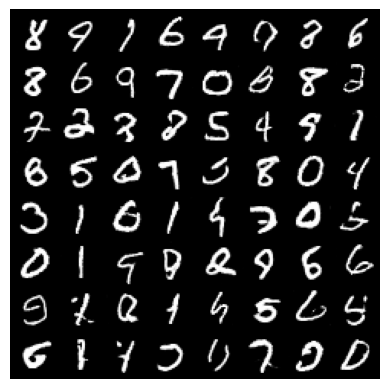

Epoch [60/100], Batch [100/938], D_real: 0.9589, D_fake: 0.1409, Loss_D: 0.2406, Loss_G: 3.8444
Epoch [60/100], Batch [200/938], D_real: 0.8271, D_fake: 0.0692, Loss_D: 0.3466, Loss_G: 3.3522
Epoch [60/100], Batch [300/938], D_real: 0.7934, D_fake: 0.0144, Loss_D: 0.3154, Loss_G: 5.9914
Epoch [60/100], Batch [400/938], D_real: 0.9830, D_fake: 0.1996, Loss_D: 0.2858, Loss_G: 2.1955
Epoch [60/100], Batch [500/938], D_real: 0.9749, D_fake: 0.1429, Loss_D: 0.2068, Loss_G: 2.9346
Epoch [60/100], Batch [600/938], D_real: 0.8752, D_fake: 0.1606, Loss_D: 0.4021, Loss_G: 3.1705
Epoch [60/100], Batch [700/938], D_real: 0.9389, D_fake: 0.1593, Loss_D: 0.2864, Loss_G: 3.5761
Epoch [60/100], Batch [800/938], D_real: 0.8782, D_fake: 0.0919, Loss_D: 0.2712, Loss_G: 3.5150
Epoch [60/100], Batch [900/938], D_real: 0.9199, D_fake: 0.1256, Loss_D: 0.2511, Loss_G: 2.7103


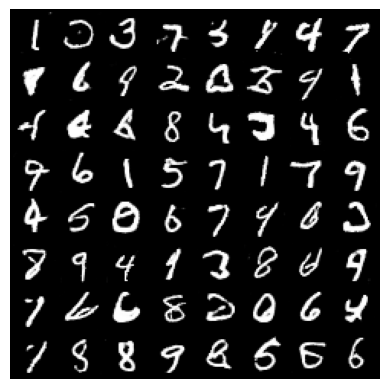

Epoch [61/100], Batch [100/938], D_real: 0.8903, D_fake: 0.0555, Loss_D: 0.1903, Loss_G: 4.1512
Epoch [61/100], Batch [200/938], D_real: 0.9603, D_fake: 0.1341, Loss_D: 0.2223, Loss_G: 3.1566
Epoch [61/100], Batch [300/938], D_real: 0.8553, D_fake: 0.1414, Loss_D: 0.3941, Loss_G: 3.0068
Epoch [61/100], Batch [400/938], D_real: 0.9115, D_fake: 0.1697, Loss_D: 0.3645, Loss_G: 4.6647
Epoch [61/100], Batch [500/938], D_real: 0.7434, D_fake: 0.0103, Loss_D: 0.3888, Loss_G: 4.5488
Epoch [61/100], Batch [600/938], D_real: 0.9959, D_fake: 0.3211, Loss_D: 0.5383, Loss_G: 2.3432
Epoch [61/100], Batch [700/938], D_real: 0.8801, D_fake: 0.0656, Loss_D: 0.2156, Loss_G: 4.0435
Epoch [61/100], Batch [800/938], D_real: 0.9713, D_fake: 0.2250, Loss_D: 0.3881, Loss_G: 2.6908
Epoch [61/100], Batch [900/938], D_real: 0.9218, D_fake: 0.1446, Loss_D: 0.2928, Loss_G: 2.7022


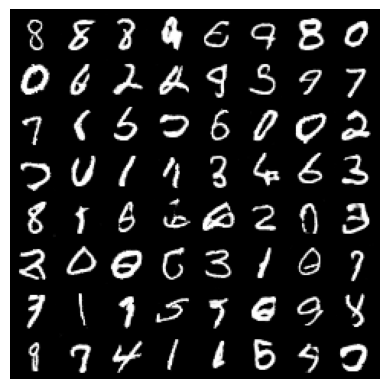

Epoch [62/100], Batch [100/938], D_real: 0.9635, D_fake: 0.1033, Loss_D: 0.1872, Loss_G: 3.7857
Epoch [62/100], Batch [200/938], D_real: 0.6786, D_fake: 0.0072, Loss_D: 0.5608, Loss_G: 4.9332
Epoch [62/100], Batch [300/938], D_real: 0.9322, D_fake: 0.1054, Loss_D: 0.2014, Loss_G: 4.0089
Epoch [62/100], Batch [400/938], D_real: 0.9706, D_fake: 0.1069, Loss_D: 0.1651, Loss_G: 4.3149
Epoch [62/100], Batch [500/938], D_real: 0.9779, D_fake: 0.0892, Loss_D: 0.1361, Loss_G: 4.7654
Epoch [62/100], Batch [600/938], D_real: 0.9615, D_fake: 0.0887, Loss_D: 0.1508, Loss_G: 3.7545
Epoch [62/100], Batch [700/938], D_real: 0.9196, D_fake: 0.1040, Loss_D: 0.2314, Loss_G: 1.6312
Epoch [62/100], Batch [800/938], D_real: 0.9630, D_fake: 0.1741, Loss_D: 0.3639, Loss_G: 2.2953
Epoch [62/100], Batch [900/938], D_real: 0.8723, D_fake: 0.1335, Loss_D: 0.3189, Loss_G: 5.2236


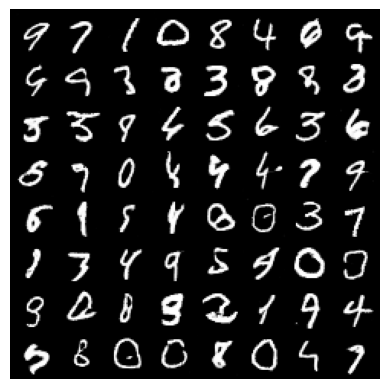

Epoch [63/100], Batch [100/938], D_real: 0.9045, D_fake: 0.0132, Loss_D: 0.1307, Loss_G: 5.2777
Epoch [63/100], Batch [200/938], D_real: 0.9408, D_fake: 0.0723, Loss_D: 0.1469, Loss_G: 3.2158
Epoch [63/100], Batch [300/938], D_real: 0.7689, D_fake: 0.0163, Loss_D: 0.3300, Loss_G: 3.8727
Epoch [63/100], Batch [400/938], D_real: 0.9692, D_fake: 0.0852, Loss_D: 0.1375, Loss_G: 3.8276
Epoch [63/100], Batch [500/938], D_real: 0.7924, D_fake: 0.0783, Loss_D: 0.4253, Loss_G: 3.5219
Epoch [63/100], Batch [600/938], D_real: 0.8498, D_fake: 0.0262, Loss_D: 0.2211, Loss_G: 4.4165
Epoch [63/100], Batch [700/938], D_real: 0.7373, D_fake: 0.0240, Loss_D: 0.3959, Loss_G: 3.5084
Epoch [63/100], Batch [800/938], D_real: 0.7917, D_fake: 0.0136, Loss_D: 0.2995, Loss_G: 5.2962
Epoch [63/100], Batch [900/938], D_real: 0.9763, D_fake: 0.2298, Loss_D: 0.4090, Loss_G: 2.7473


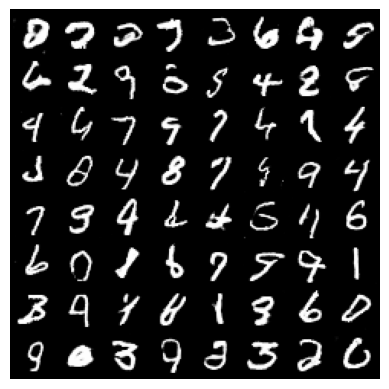

Epoch [64/100], Batch [100/938], D_real: 0.9444, D_fake: 0.0642, Loss_D: 0.1361, Loss_G: 5.3478
Epoch [64/100], Batch [200/938], D_real: 0.9449, D_fake: 0.0811, Loss_D: 0.1535, Loss_G: 3.5589
Epoch [64/100], Batch [300/938], D_real: 0.7228, D_fake: 0.0157, Loss_D: 0.4330, Loss_G: 6.3441
Epoch [64/100], Batch [400/938], D_real: 0.9795, D_fake: 0.3017, Loss_D: 0.5695, Loss_G: 3.9672
Epoch [64/100], Batch [500/938], D_real: 0.8782, D_fake: 0.0555, Loss_D: 0.2269, Loss_G: 4.2694
Epoch [64/100], Batch [600/938], D_real: 0.8878, D_fake: 0.0185, Loss_D: 0.1550, Loss_G: 5.0011
Epoch [64/100], Batch [700/938], D_real: 0.9297, D_fake: 0.1041, Loss_D: 0.2298, Loss_G: 3.2055
Epoch [64/100], Batch [800/938], D_real: 0.8141, D_fake: 0.0818, Loss_D: 0.3571, Loss_G: 2.8629
Epoch [64/100], Batch [900/938], D_real: 0.7035, D_fake: 0.0242, Loss_D: 0.4708, Loss_G: 4.8523


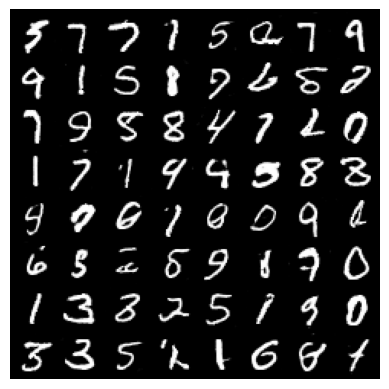

Epoch [65/100], Batch [100/938], D_real: 0.9272, D_fake: 0.0219, Loss_D: 0.1182, Loss_G: 4.7097
Epoch [65/100], Batch [200/938], D_real: 0.8989, D_fake: 0.0536, Loss_D: 0.1896, Loss_G: 3.7807
Epoch [65/100], Batch [300/938], D_real: 0.9764, D_fake: 0.0707, Loss_D: 0.1058, Loss_G: 4.6000
Epoch [65/100], Batch [400/938], D_real: 0.8938, D_fake: 0.1195, Loss_D: 0.2791, Loss_G: 3.9790
Epoch [65/100], Batch [500/938], D_real: 0.9718, D_fake: 0.2106, Loss_D: 0.3738, Loss_G: 3.4498
Epoch [65/100], Batch [600/938], D_real: 0.9276, D_fake: 0.0232, Loss_D: 0.1139, Loss_G: 4.7966
Epoch [65/100], Batch [700/938], D_real: 0.8234, D_fake: 0.0237, Loss_D: 0.2570, Loss_G: 4.9830
Epoch [65/100], Batch [800/938], D_real: 0.9653, D_fake: 0.0649, Loss_D: 0.1249, Loss_G: 4.4947
Epoch [65/100], Batch [900/938], D_real: 0.9567, D_fake: 0.0755, Loss_D: 0.1396, Loss_G: 3.8714


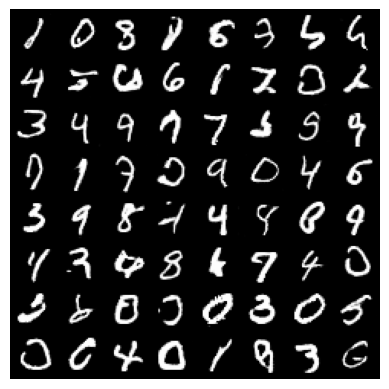

Epoch [66/100], Batch [100/938], D_real: 0.9745, D_fake: 0.1128, Loss_D: 0.1648, Loss_G: 4.2586
Epoch [66/100], Batch [200/938], D_real: 0.9440, D_fake: 0.2133, Loss_D: 0.4166, Loss_G: 3.3820
Epoch [66/100], Batch [300/938], D_real: 0.7442, D_fake: 0.0432, Loss_D: 0.4458, Loss_G: 4.1452
Epoch [66/100], Batch [400/938], D_real: 0.8112, D_fake: 0.0284, Loss_D: 0.2648, Loss_G: 3.6573
Epoch [66/100], Batch [500/938], D_real: 0.8306, D_fake: 0.0207, Loss_D: 0.2493, Loss_G: 4.6794
Epoch [66/100], Batch [600/938], D_real: 0.9816, D_fake: 0.2355, Loss_D: 0.3886, Loss_G: 1.7199
Epoch [66/100], Batch [700/938], D_real: 0.8513, D_fake: 0.0268, Loss_D: 0.2369, Loss_G: 4.2196
Epoch [66/100], Batch [800/938], D_real: 0.9866, D_fake: 0.3353, Loss_D: 0.5979, Loss_G: 3.9360
Epoch [66/100], Batch [900/938], D_real: 0.9754, D_fake: 0.2182, Loss_D: 0.3591, Loss_G: 3.6856


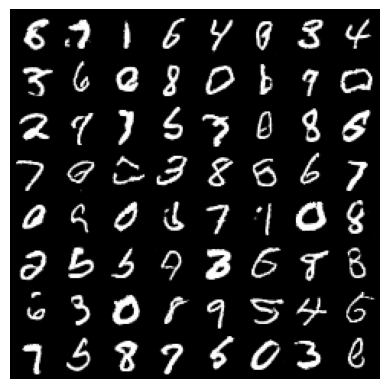

Epoch [67/100], Batch [100/938], D_real: 0.8867, D_fake: 0.0560, Loss_D: 0.1999, Loss_G: 4.5419
Epoch [67/100], Batch [200/938], D_real: 0.7400, D_fake: 0.0218, Loss_D: 0.4407, Loss_G: 5.8390
Epoch [67/100], Batch [300/938], D_real: 0.8510, D_fake: 0.0166, Loss_D: 0.2000, Loss_G: 5.4769
Epoch [67/100], Batch [400/938], D_real: 0.8977, D_fake: 0.0577, Loss_D: 0.1914, Loss_G: 4.2293
Epoch [67/100], Batch [500/938], D_real: 0.9669, D_fake: 0.1127, Loss_D: 0.1753, Loss_G: 2.9381
Epoch [67/100], Batch [600/938], D_real: 0.9202, D_fake: 0.1409, Loss_D: 0.2649, Loss_G: 2.6200
Epoch [67/100], Batch [700/938], D_real: 0.8605, D_fake: 0.0217, Loss_D: 0.2076, Loss_G: 5.5134
Epoch [67/100], Batch [800/938], D_real: 0.7782, D_fake: 0.0782, Loss_D: 0.4242, Loss_G: 2.2241
Epoch [67/100], Batch [900/938], D_real: 0.9233, D_fake: 0.1325, Loss_D: 0.2614, Loss_G: 2.9742


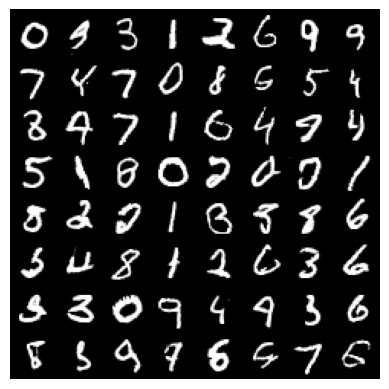

Epoch [68/100], Batch [100/938], D_real: 0.9311, D_fake: 0.1054, Loss_D: 0.2138, Loss_G: 3.6245
Epoch [68/100], Batch [200/938], D_real: 0.9637, D_fake: 0.1277, Loss_D: 0.1961, Loss_G: 3.4544
Epoch [68/100], Batch [300/938], D_real: 0.8673, D_fake: 0.1115, Loss_D: 0.3251, Loss_G: 3.9434
Epoch [68/100], Batch [400/938], D_real: 0.9268, D_fake: 0.0473, Loss_D: 0.1349, Loss_G: 4.9749
Epoch [68/100], Batch [500/938], D_real: 0.8577, D_fake: 0.1080, Loss_D: 0.3325, Loss_G: 2.8950
Epoch [68/100], Batch [600/938], D_real: 0.9523, D_fake: 0.0813, Loss_D: 0.1573, Loss_G: 4.3152
Epoch [68/100], Batch [700/938], D_real: 0.8946, D_fake: 0.1148, Loss_D: 0.2852, Loss_G: 2.4877
Epoch [68/100], Batch [800/938], D_real: 0.8548, D_fake: 0.1572, Loss_D: 0.4345, Loss_G: 4.5753
Epoch [68/100], Batch [900/938], D_real: 0.9573, D_fake: 0.2100, Loss_D: 0.3589, Loss_G: 2.9751


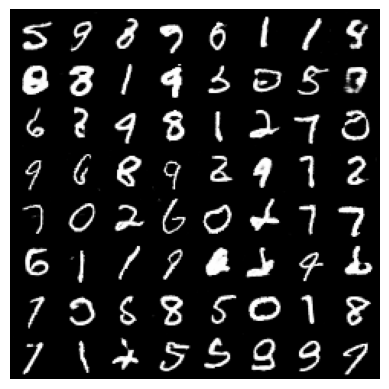

Epoch [69/100], Batch [100/938], D_real: 0.9272, D_fake: 0.0446, Loss_D: 0.1375, Loss_G: 4.9289
Epoch [69/100], Batch [200/938], D_real: 0.9543, D_fake: 0.0492, Loss_D: 0.1264, Loss_G: 4.7453
Epoch [69/100], Batch [300/938], D_real: 0.8858, D_fake: 0.1536, Loss_D: 0.3756, Loss_G: 3.4133
Epoch [69/100], Batch [400/938], D_real: 0.8025, D_fake: 0.0233, Loss_D: 0.3126, Loss_G: 6.4662
Epoch [69/100], Batch [500/938], D_real: 0.9680, D_fake: 0.0546, Loss_D: 0.0996, Loss_G: 4.2240
Epoch [69/100], Batch [600/938], D_real: 0.8730, D_fake: 0.0916, Loss_D: 0.2993, Loss_G: 5.2094
Epoch [69/100], Batch [700/938], D_real: 0.9880, D_fake: 0.1063, Loss_D: 0.1363, Loss_G: 3.8971
Epoch [69/100], Batch [800/938], D_real: 0.9422, D_fake: 0.0912, Loss_D: 0.1813, Loss_G: 3.0926
Epoch [69/100], Batch [900/938], D_real: 0.9789, D_fake: 0.1690, Loss_D: 0.2635, Loss_G: 3.9166


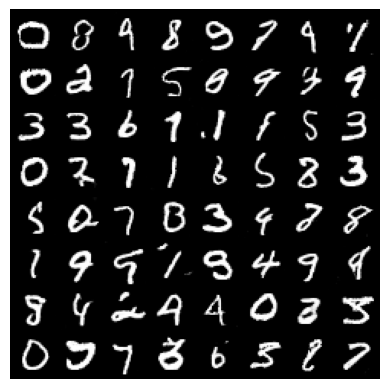

Epoch [70/100], Batch [100/938], D_real: 0.9084, D_fake: 0.1165, Loss_D: 0.2900, Loss_G: 3.7956
Epoch [70/100], Batch [200/938], D_real: 0.9406, D_fake: 0.1708, Loss_D: 0.2904, Loss_G: 3.2234
Epoch [70/100], Batch [300/938], D_real: 0.9572, D_fake: 0.1133, Loss_D: 0.1989, Loss_G: 3.6797
Epoch [70/100], Batch [400/938], D_real: 0.9078, D_fake: 0.0499, Loss_D: 0.1620, Loss_G: 3.3718
Epoch [70/100], Batch [500/938], D_real: 0.9618, D_fake: 0.1112, Loss_D: 0.1748, Loss_G: 2.9582
Epoch [70/100], Batch [600/938], D_real: 0.9961, D_fake: 0.3936, Loss_D: 0.7168, Loss_G: 2.1341
Epoch [70/100], Batch [700/938], D_real: 0.8785, D_fake: 0.0715, Loss_D: 0.2329, Loss_G: 3.1693
Epoch [70/100], Batch [800/938], D_real: 0.8777, D_fake: 0.0473, Loss_D: 0.2098, Loss_G: 3.0354
Epoch [70/100], Batch [900/938], D_real: 0.9582, D_fake: 0.0533, Loss_D: 0.1071, Loss_G: 3.9685


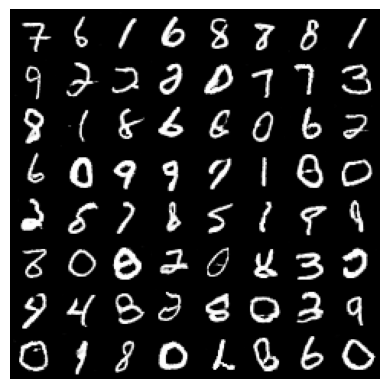

Epoch [71/100], Batch [100/938], D_real: 0.8668, D_fake: 0.0367, Loss_D: 0.2162, Loss_G: 3.6361
Epoch [71/100], Batch [200/938], D_real: 0.9821, D_fake: 0.1276, Loss_D: 0.1715, Loss_G: 2.6545
Epoch [71/100], Batch [300/938], D_real: 0.7245, D_fake: 0.0134, Loss_D: 0.3730, Loss_G: 3.4360
Epoch [71/100], Batch [400/938], D_real: 0.9477, D_fake: 0.1533, Loss_D: 0.2830, Loss_G: 2.0905
Epoch [71/100], Batch [500/938], D_real: 0.9845, D_fake: 0.0990, Loss_D: 0.1344, Loss_G: 4.2017
Epoch [71/100], Batch [600/938], D_real: 0.9896, D_fake: 0.1376, Loss_D: 0.2141, Loss_G: 4.3097
Epoch [71/100], Batch [700/938], D_real: 0.9791, D_fake: 0.0714, Loss_D: 0.1597, Loss_G: 4.4950
Epoch [71/100], Batch [800/938], D_real: 0.9809, D_fake: 0.1891, Loss_D: 0.3145, Loss_G: 3.8765
Epoch [71/100], Batch [900/938], D_real: 0.9525, D_fake: 0.3053, Loss_D: 0.5386, Loss_G: 2.8689


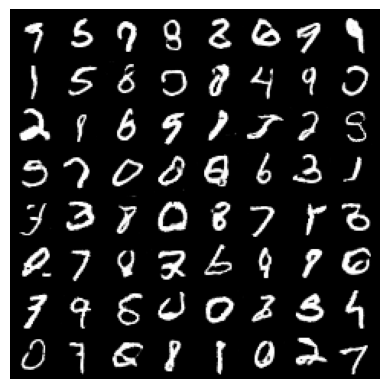

Epoch [72/100], Batch [100/938], D_real: 0.9169, D_fake: 0.0217, Loss_D: 0.1268, Loss_G: 4.5790
Epoch [72/100], Batch [200/938], D_real: 0.9769, D_fake: 0.0794, Loss_D: 0.1146, Loss_G: 3.8088
Epoch [72/100], Batch [300/938], D_real: 0.8943, D_fake: 0.0615, Loss_D: 0.2268, Loss_G: 3.7563
Epoch [72/100], Batch [400/938], D_real: 0.9483, D_fake: 0.0434, Loss_D: 0.1059, Loss_G: 4.9503
Epoch [72/100], Batch [500/938], D_real: 0.8548, D_fake: 0.0877, Loss_D: 0.2803, Loss_G: 2.8954
Epoch [72/100], Batch [600/938], D_real: 0.8403, D_fake: 0.0321, Loss_D: 0.2713, Loss_G: 5.3169
Epoch [72/100], Batch [700/938], D_real: 0.8319, D_fake: 0.0160, Loss_D: 0.2408, Loss_G: 5.0737
Epoch [72/100], Batch [800/938], D_real: 0.7637, D_fake: 0.0288, Loss_D: 0.3857, Loss_G: 5.4386
Epoch [72/100], Batch [900/938], D_real: 0.9278, D_fake: 0.1003, Loss_D: 0.2271, Loss_G: 2.8022


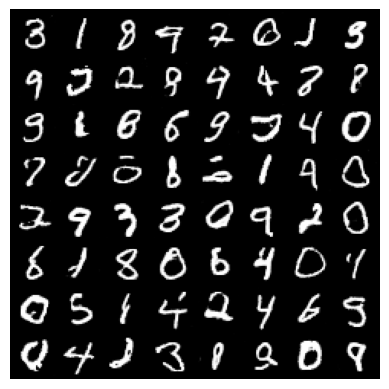

Epoch [73/100], Batch [100/938], D_real: 0.9896, D_fake: 0.1866, Loss_D: 0.3496, Loss_G: 3.4552
Epoch [73/100], Batch [200/938], D_real: 0.8141, D_fake: 0.0335, Loss_D: 0.2850, Loss_G: 4.8540
Epoch [73/100], Batch [300/938], D_real: 0.8803, D_fake: 0.0260, Loss_D: 0.1714, Loss_G: 5.9842
Epoch [73/100], Batch [400/938], D_real: 0.9901, D_fake: 0.3271, Loss_D: 0.6674, Loss_G: 2.8753
Epoch [73/100], Batch [500/938], D_real: 0.9596, D_fake: 0.1080, Loss_D: 0.2079, Loss_G: 4.2182
Epoch [73/100], Batch [600/938], D_real: 0.7795, D_fake: 0.0208, Loss_D: 0.3868, Loss_G: 4.7283
Epoch [73/100], Batch [700/938], D_real: 0.9460, D_fake: 0.0181, Loss_D: 0.0824, Loss_G: 5.4494
Epoch [73/100], Batch [800/938], D_real: 0.9314, D_fake: 0.0261, Loss_D: 0.1131, Loss_G: 5.5734
Epoch [73/100], Batch [900/938], D_real: 0.8626, D_fake: 0.0060, Loss_D: 0.1743, Loss_G: 6.0269


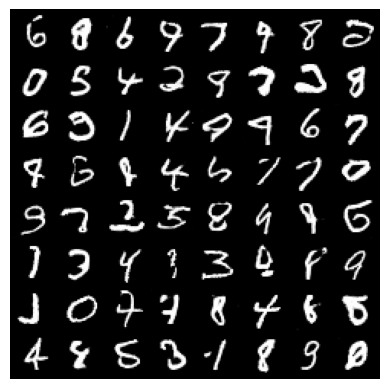

Epoch [74/100], Batch [100/938], D_real: 0.9543, D_fake: 0.1127, Loss_D: 0.2275, Loss_G: 4.6353
Epoch [74/100], Batch [200/938], D_real: 0.9410, D_fake: 0.0244, Loss_D: 0.0908, Loss_G: 4.1933
Epoch [74/100], Batch [300/938], D_real: 0.8690, D_fake: 0.0542, Loss_D: 0.2154, Loss_G: 3.6056
Epoch [74/100], Batch [400/938], D_real: 0.9165, D_fake: 0.0712, Loss_D: 0.1821, Loss_G: 3.7580
Epoch [74/100], Batch [500/938], D_real: 0.7653, D_fake: 0.0184, Loss_D: 0.3802, Loss_G: 4.0177
Epoch [74/100], Batch [600/938], D_real: 0.8718, D_fake: 0.0791, Loss_D: 0.2688, Loss_G: 2.7401
Epoch [74/100], Batch [700/938], D_real: 0.9171, D_fake: 0.0122, Loss_D: 0.1116, Loss_G: 6.1146
Epoch [74/100], Batch [800/938], D_real: 0.4389, D_fake: 0.0027, Loss_D: 1.2269, Loss_G: 5.6172
Epoch [74/100], Batch [900/938], D_real: 0.9076, D_fake: 0.0599, Loss_D: 0.1980, Loss_G: 4.7502


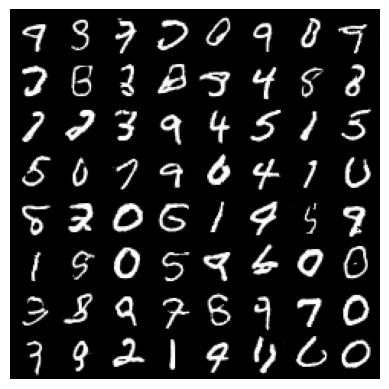

Epoch [75/100], Batch [100/938], D_real: 0.8287, D_fake: 0.0106, Loss_D: 0.2373, Loss_G: 5.5109
Epoch [75/100], Batch [200/938], D_real: 0.9788, D_fake: 0.0800, Loss_D: 0.1158, Loss_G: 4.8142
Epoch [75/100], Batch [300/938], D_real: 0.9907, D_fake: 0.3376, Loss_D: 0.5426, Loss_G: 3.4443
Epoch [75/100], Batch [400/938], D_real: 0.9470, D_fake: 0.0668, Loss_D: 0.1403, Loss_G: 4.2624
Epoch [75/100], Batch [500/938], D_real: 0.9639, D_fake: 0.1097, Loss_D: 0.1721, Loss_G: 4.3250
Epoch [75/100], Batch [600/938], D_real: 0.9353, D_fake: 0.0354, Loss_D: 0.1228, Loss_G: 3.7771
Epoch [75/100], Batch [700/938], D_real: 0.9895, D_fake: 0.4181, Loss_D: 0.7849, Loss_G: 3.0482
Epoch [75/100], Batch [800/938], D_real: 0.9255, D_fake: 0.0872, Loss_D: 0.2302, Loss_G: 3.9271
Epoch [75/100], Batch [900/938], D_real: 0.9653, D_fake: 0.1769, Loss_D: 0.2668, Loss_G: 3.5950


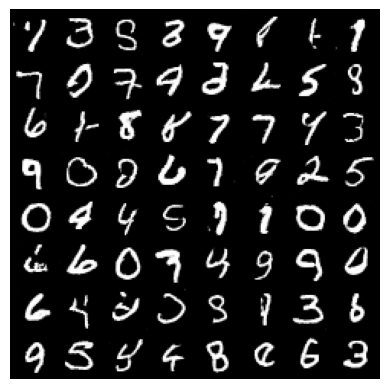

Epoch [76/100], Batch [100/938], D_real: 0.9197, D_fake: 0.1008, Loss_D: 0.2239, Loss_G: 4.0421
Epoch [76/100], Batch [200/938], D_real: 0.9865, D_fake: 0.2049, Loss_D: 0.3391, Loss_G: 2.2422
Epoch [76/100], Batch [300/938], D_real: 0.8134, D_fake: 0.0238, Loss_D: 0.2788, Loss_G: 4.1180
Epoch [76/100], Batch [400/938], D_real: 0.8467, D_fake: 0.0392, Loss_D: 0.2514, Loss_G: 5.0571
Epoch [76/100], Batch [500/938], D_real: 0.9361, D_fake: 0.0616, Loss_D: 0.1446, Loss_G: 4.7105
Epoch [76/100], Batch [600/938], D_real: 0.9368, D_fake: 0.1500, Loss_D: 0.2818, Loss_G: 3.2197
Epoch [76/100], Batch [700/938], D_real: 0.9048, D_fake: 0.0706, Loss_D: 0.1962, Loss_G: 4.8260
Epoch [76/100], Batch [800/938], D_real: 0.8943, D_fake: 0.0376, Loss_D: 0.1735, Loss_G: 5.2928
Epoch [76/100], Batch [900/938], D_real: 0.9912, D_fake: 0.2177, Loss_D: 0.3171, Loss_G: 2.5935


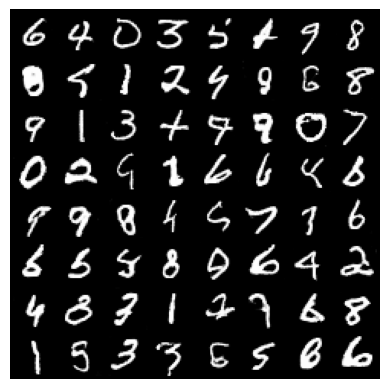

Epoch [77/100], Batch [100/938], D_real: 0.8528, D_fake: 0.0441, Loss_D: 0.2339, Loss_G: 3.5557
Epoch [77/100], Batch [200/938], D_real: 0.9520, D_fake: 0.0802, Loss_D: 0.1458, Loss_G: 4.1611
Epoch [77/100], Batch [300/938], D_real: 0.9734, D_fake: 0.1576, Loss_D: 0.2593, Loss_G: 3.4681
Epoch [77/100], Batch [400/938], D_real: 0.9503, D_fake: 0.0558, Loss_D: 0.1183, Loss_G: 4.9190
Epoch [77/100], Batch [500/938], D_real: 0.9766, D_fake: 0.0791, Loss_D: 0.1162, Loss_G: 3.9378
Epoch [77/100], Batch [600/938], D_real: 0.8010, D_fake: 0.0210, Loss_D: 0.2859, Loss_G: 4.4613
Epoch [77/100], Batch [700/938], D_real: 0.9252, D_fake: 0.1095, Loss_D: 0.2158, Loss_G: 2.3733
Epoch [77/100], Batch [800/938], D_real: 0.9886, D_fake: 0.3497, Loss_D: 0.5931, Loss_G: 2.9959
Epoch [77/100], Batch [900/938], D_real: 0.8487, D_fake: 0.0950, Loss_D: 0.3594, Loss_G: 4.0246


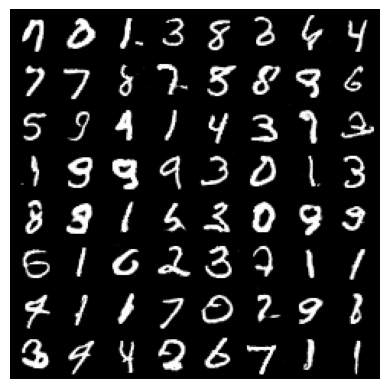

Epoch [78/100], Batch [100/938], D_real: 0.9192, D_fake: 0.0334, Loss_D: 0.1310, Loss_G: 5.4242
Epoch [78/100], Batch [200/938], D_real: 0.6386, D_fake: 0.0155, Loss_D: 0.6483, Loss_G: 4.3218
Epoch [78/100], Batch [300/938], D_real: 0.9006, D_fake: 0.0666, Loss_D: 0.1990, Loss_G: 4.1883
Epoch [78/100], Batch [400/938], D_real: 0.8499, D_fake: 0.0253, Loss_D: 0.2245, Loss_G: 4.3008
Epoch [78/100], Batch [500/938], D_real: 0.9618, D_fake: 0.0455, Loss_D: 0.0908, Loss_G: 4.3106
Epoch [78/100], Batch [600/938], D_real: 0.8682, D_fake: 0.0708, Loss_D: 0.2787, Loss_G: 4.5308
Epoch [78/100], Batch [700/938], D_real: 0.9172, D_fake: 0.1556, Loss_D: 0.3165, Loss_G: 4.0416
Epoch [78/100], Batch [800/938], D_real: 0.7161, D_fake: 0.0093, Loss_D: 0.4399, Loss_G: 5.7263
Epoch [78/100], Batch [900/938], D_real: 0.9071, D_fake: 0.0699, Loss_D: 0.2130, Loss_G: 3.7780


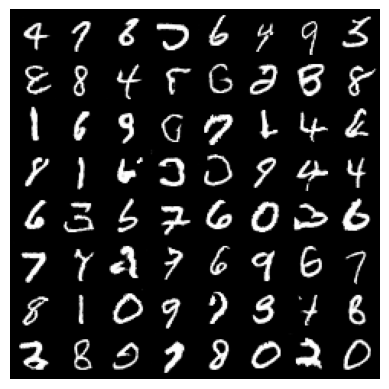

Epoch [79/100], Batch [100/938], D_real: 0.9704, D_fake: 0.0378, Loss_D: 0.0725, Loss_G: 4.7143
Epoch [79/100], Batch [200/938], D_real: 0.9491, D_fake: 0.0755, Loss_D: 0.1423, Loss_G: 4.3283
Epoch [79/100], Batch [300/938], D_real: 0.6741, D_fake: 0.0405, Loss_D: 0.5563, Loss_G: 3.6156
Epoch [79/100], Batch [400/938], D_real: 0.8737, D_fake: 0.0199, Loss_D: 0.1743, Loss_G: 3.6089
Epoch [79/100], Batch [500/938], D_real: 0.8928, D_fake: 0.0392, Loss_D: 0.1752, Loss_G: 4.3944
Epoch [79/100], Batch [600/938], D_real: 0.9786, D_fake: 0.0937, Loss_D: 0.1445, Loss_G: 3.3569
Epoch [79/100], Batch [700/938], D_real: 0.8353, D_fake: 0.0846, Loss_D: 0.3678, Loss_G: 4.9799
Epoch [79/100], Batch [800/938], D_real: 0.8468, D_fake: 0.0747, Loss_D: 0.2954, Loss_G: 3.4137
Epoch [79/100], Batch [900/938], D_real: 0.9946, D_fake: 0.2544, Loss_D: 0.3869, Loss_G: 3.8279


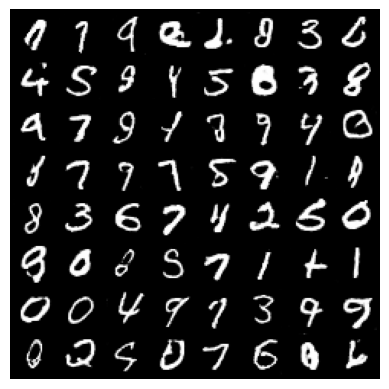

Epoch [80/100], Batch [100/938], D_real: 0.6747, D_fake: 0.0219, Loss_D: 0.5493, Loss_G: 3.9471
Epoch [80/100], Batch [200/938], D_real: 0.9754, D_fake: 0.0462, Loss_D: 0.0758, Loss_G: 3.4255
Epoch [80/100], Batch [300/938], D_real: 0.9609, D_fake: 0.2261, Loss_D: 0.3992, Loss_G: 2.9101
Epoch [80/100], Batch [400/938], D_real: 0.8928, D_fake: 0.0820, Loss_D: 0.2231, Loss_G: 3.1767
Epoch [80/100], Batch [500/938], D_real: 0.8339, D_fake: 0.0534, Loss_D: 0.3241, Loss_G: 5.6831
Epoch [80/100], Batch [600/938], D_real: 0.9547, D_fake: 0.1073, Loss_D: 0.1908, Loss_G: 4.6645
Epoch [80/100], Batch [700/938], D_real: 0.9565, D_fake: 0.1812, Loss_D: 0.2825, Loss_G: 3.6078
Epoch [80/100], Batch [800/938], D_real: 0.8068, D_fake: 0.0273, Loss_D: 0.3026, Loss_G: 4.3119
Epoch [80/100], Batch [900/938], D_real: 0.5826, D_fake: 0.0059, Loss_D: 0.7775, Loss_G: 4.1120


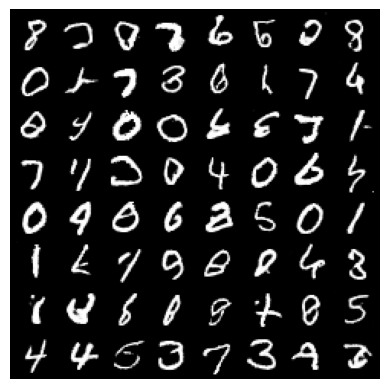

Epoch [81/100], Batch [100/938], D_real: 0.9282, D_fake: 0.0615, Loss_D: 0.1538, Loss_G: 3.4789
Epoch [81/100], Batch [200/938], D_real: 0.9379, D_fake: 0.0544, Loss_D: 0.1370, Loss_G: 5.1116
Epoch [81/100], Batch [300/938], D_real: 0.9865, D_fake: 0.1261, Loss_D: 0.1788, Loss_G: 3.3511
Epoch [81/100], Batch [400/938], D_real: 0.9585, D_fake: 0.1028, Loss_D: 0.1812, Loss_G: 3.4316
Epoch [81/100], Batch [500/938], D_real: 0.9017, D_fake: 0.0254, Loss_D: 0.1561, Loss_G: 6.0253
Epoch [81/100], Batch [600/938], D_real: 0.9867, D_fake: 0.2603, Loss_D: 0.4927, Loss_G: 3.8211
Epoch [81/100], Batch [700/938], D_real: 0.8869, D_fake: 0.1452, Loss_D: 0.3391, Loss_G: 4.6522
Epoch [81/100], Batch [800/938], D_real: 0.8885, D_fake: 0.1262, Loss_D: 0.2924, Loss_G: 3.6250
Epoch [81/100], Batch [900/938], D_real: 0.9533, D_fake: 0.0678, Loss_D: 0.1451, Loss_G: 3.9372


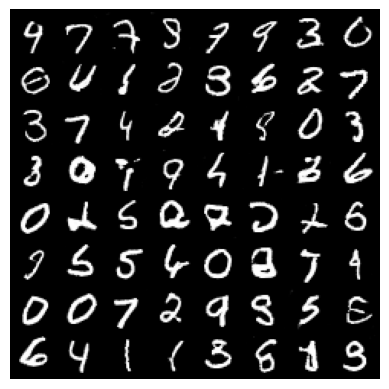

Epoch [82/100], Batch [100/938], D_real: 0.8949, D_fake: 0.0105, Loss_D: 0.1314, Loss_G: 6.8284
Epoch [82/100], Batch [200/938], D_real: 0.7236, D_fake: 0.0248, Loss_D: 0.4594, Loss_G: 5.6469
Epoch [82/100], Batch [300/938], D_real: 0.8633, D_fake: 0.0109, Loss_D: 0.1767, Loss_G: 6.6315
Epoch [82/100], Batch [400/938], D_real: 0.9041, D_fake: 0.0693, Loss_D: 0.1902, Loss_G: 3.4354
Epoch [82/100], Batch [500/938], D_real: 0.8406, D_fake: 0.0716, Loss_D: 0.3011, Loss_G: 4.2155
Epoch [82/100], Batch [600/938], D_real: 0.8504, D_fake: 0.0401, Loss_D: 0.2468, Loss_G: 4.3082
Epoch [82/100], Batch [700/938], D_real: 0.7902, D_fake: 0.0254, Loss_D: 0.3282, Loss_G: 3.4632
Epoch [82/100], Batch [800/938], D_real: 0.8854, D_fake: 0.0551, Loss_D: 0.2220, Loss_G: 5.2029
Epoch [82/100], Batch [900/938], D_real: 0.8335, D_fake: 0.0444, Loss_D: 0.2897, Loss_G: 6.6558


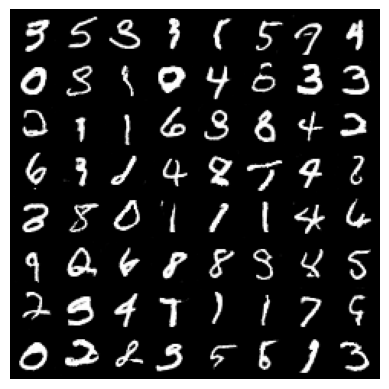

Epoch [83/100], Batch [100/938], D_real: 0.9311, D_fake: 0.0404, Loss_D: 0.1203, Loss_G: 4.4880
Epoch [83/100], Batch [200/938], D_real: 0.8639, D_fake: 0.0181, Loss_D: 0.1899, Loss_G: 3.4721
Epoch [83/100], Batch [300/938], D_real: 0.9483, D_fake: 0.1417, Loss_D: 0.2426, Loss_G: 3.4863
Epoch [83/100], Batch [400/938], D_real: 0.9917, D_fake: 0.2564, Loss_D: 0.3852, Loss_G: 2.4312
Epoch [83/100], Batch [500/938], D_real: 0.8407, D_fake: 0.0610, Loss_D: 0.2838, Loss_G: 4.5553
Epoch [83/100], Batch [600/938], D_real: 0.7798, D_fake: 0.0105, Loss_D: 0.3468, Loss_G: 6.7209
Epoch [83/100], Batch [700/938], D_real: 0.9551, D_fake: 0.0796, Loss_D: 0.1472, Loss_G: 4.5044
Epoch [83/100], Batch [800/938], D_real: 0.6871, D_fake: 0.0259, Loss_D: 0.5823, Loss_G: 4.2930
Epoch [83/100], Batch [900/938], D_real: 0.9946, D_fake: 0.2056, Loss_D: 0.2879, Loss_G: 2.9326


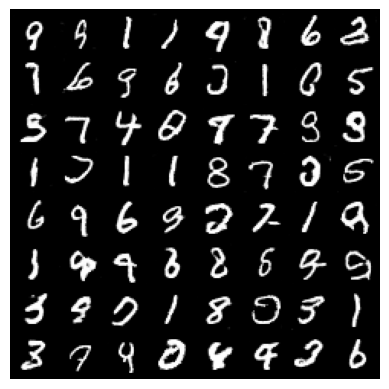

Epoch [84/100], Batch [100/938], D_real: 0.9720, D_fake: 0.0372, Loss_D: 0.0727, Loss_G: 4.4479
Epoch [84/100], Batch [200/938], D_real: 0.9013, D_fake: 0.0423, Loss_D: 0.1642, Loss_G: 4.1346
Epoch [84/100], Batch [300/938], D_real: 0.9454, D_fake: 0.0652, Loss_D: 0.1402, Loss_G: 3.2984
Epoch [84/100], Batch [400/938], D_real: 0.9106, D_fake: 0.0389, Loss_D: 0.1450, Loss_G: 5.6174
Epoch [84/100], Batch [500/938], D_real: 0.9306, D_fake: 0.1494, Loss_D: 0.2995, Loss_G: 3.3697
Epoch [84/100], Batch [600/938], D_real: 0.9462, D_fake: 0.0269, Loss_D: 0.0890, Loss_G: 5.4542
Epoch [84/100], Batch [700/938], D_real: 0.9420, D_fake: 0.0672, Loss_D: 0.1581, Loss_G: 4.0617
Epoch [84/100], Batch [800/938], D_real: 0.8615, D_fake: 0.0237, Loss_D: 0.2044, Loss_G: 4.4538
Epoch [84/100], Batch [900/938], D_real: 0.9453, D_fake: 0.0445, Loss_D: 0.1178, Loss_G: 4.2358


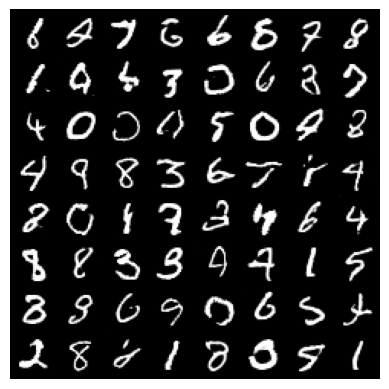

Epoch [85/100], Batch [100/938], D_real: 0.7626, D_fake: 0.0181, Loss_D: 0.3746, Loss_G: 4.7528
Epoch [85/100], Batch [200/938], D_real: 0.9206, D_fake: 0.0806, Loss_D: 0.2028, Loss_G: 3.3066
Epoch [85/100], Batch [300/938], D_real: 0.9379, D_fake: 0.0789, Loss_D: 0.1945, Loss_G: 2.7771
Epoch [85/100], Batch [400/938], D_real: 0.8757, D_fake: 0.0981, Loss_D: 0.3057, Loss_G: 5.2871
Epoch [85/100], Batch [500/938], D_real: 0.9160, D_fake: 0.0825, Loss_D: 0.2059, Loss_G: 3.3129
Epoch [85/100], Batch [600/938], D_real: 0.8624, D_fake: 0.0758, Loss_D: 0.2746, Loss_G: 3.5159
Epoch [85/100], Batch [700/938], D_real: 0.9363, D_fake: 0.1046, Loss_D: 0.2073, Loss_G: 2.6221
Epoch [85/100], Batch [800/938], D_real: 0.9378, D_fake: 0.2333, Loss_D: 0.4253, Loss_G: 3.4969
Epoch [85/100], Batch [900/938], D_real: 0.8283, D_fake: 0.0311, Loss_D: 0.2733, Loss_G: 5.7653


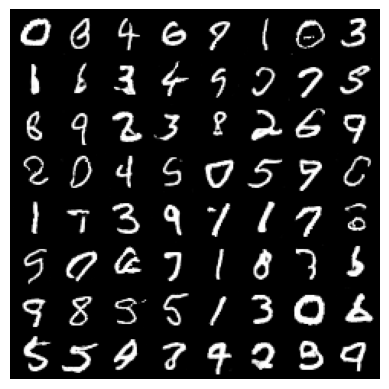

Epoch [86/100], Batch [100/938], D_real: 0.8505, D_fake: 0.0073, Loss_D: 0.1977, Loss_G: 5.9785
Epoch [86/100], Batch [200/938], D_real: 0.9649, D_fake: 0.0385, Loss_D: 0.0830, Loss_G: 4.8428
Epoch [86/100], Batch [300/938], D_real: 0.9696, D_fake: 0.0807, Loss_D: 0.1356, Loss_G: 4.4699
Epoch [86/100], Batch [400/938], D_real: 0.9906, D_fake: 0.3136, Loss_D: 0.5347, Loss_G: 3.0071
Epoch [86/100], Batch [500/938], D_real: 0.8393, D_fake: 0.0445, Loss_D: 0.2815, Loss_G: 4.5056
Epoch [86/100], Batch [600/938], D_real: 0.8840, D_fake: 0.0079, Loss_D: 0.1454, Loss_G: 6.5512
Epoch [86/100], Batch [700/938], D_real: 0.8343, D_fake: 0.0282, Loss_D: 0.2546, Loss_G: 4.9187
Epoch [86/100], Batch [800/938], D_real: 0.9723, D_fake: 0.1130, Loss_D: 0.1931, Loss_G: 4.5074
Epoch [86/100], Batch [900/938], D_real: 0.9456, D_fake: 0.0860, Loss_D: 0.1626, Loss_G: 3.1027


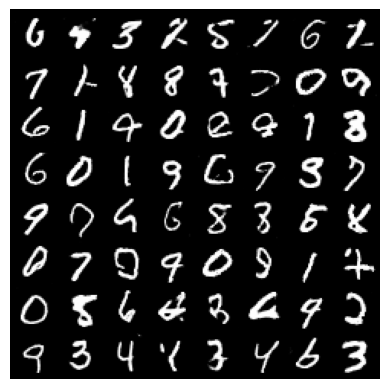

Epoch [87/100], Batch [100/938], D_real: 0.8444, D_fake: 0.0905, Loss_D: 0.3272, Loss_G: 4.4365
Epoch [87/100], Batch [200/938], D_real: 0.9137, D_fake: 0.0325, Loss_D: 0.1378, Loss_G: 3.8119
Epoch [87/100], Batch [300/938], D_real: 0.8315, D_fake: 0.0173, Loss_D: 0.2723, Loss_G: 6.3625
Epoch [87/100], Batch [400/938], D_real: 0.9881, D_fake: 0.1386, Loss_D: 0.2100, Loss_G: 3.7617
Epoch [87/100], Batch [500/938], D_real: 0.9421, D_fake: 0.0860, Loss_D: 0.1737, Loss_G: 3.7995
Epoch [87/100], Batch [600/938], D_real: 0.8322, D_fake: 0.0638, Loss_D: 0.3355, Loss_G: 2.3781
Epoch [87/100], Batch [700/938], D_real: 0.9835, D_fake: 0.1432, Loss_D: 0.1994, Loss_G: 4.4974
Epoch [87/100], Batch [800/938], D_real: 0.8993, D_fake: 0.0381, Loss_D: 0.1657, Loss_G: 3.8067
Epoch [87/100], Batch [900/938], D_real: 0.9388, D_fake: 0.0387, Loss_D: 0.1102, Loss_G: 5.1155


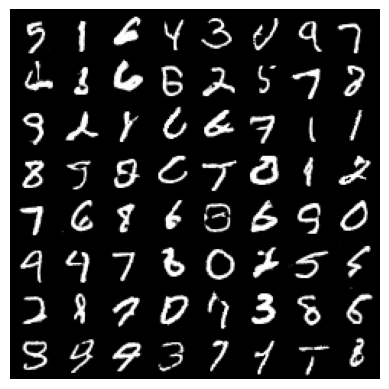

Epoch [88/100], Batch [100/938], D_real: 0.9239, D_fake: 0.0589, Loss_D: 0.1510, Loss_G: 5.1737
Epoch [88/100], Batch [200/938], D_real: 0.9895, D_fake: 0.2311, Loss_D: 0.3685, Loss_G: 2.4784
Epoch [88/100], Batch [300/938], D_real: 0.8709, D_fake: 0.0092, Loss_D: 0.1781, Loss_G: 6.4396
Epoch [88/100], Batch [400/938], D_real: 0.9114, D_fake: 0.0541, Loss_D: 0.1785, Loss_G: 4.7766
Epoch [88/100], Batch [500/938], D_real: 0.9911, D_fake: 0.1754, Loss_D: 0.2584, Loss_G: 2.9121
Epoch [88/100], Batch [600/938], D_real: 0.9741, D_fake: 0.1210, Loss_D: 0.1832, Loss_G: 3.7334
Epoch [88/100], Batch [700/938], D_real: 0.9019, D_fake: 0.0047, Loss_D: 0.1184, Loss_G: 7.3935
Epoch [88/100], Batch [800/938], D_real: 0.9624, D_fake: 0.0923, Loss_D: 0.1489, Loss_G: 4.8681
Epoch [88/100], Batch [900/938], D_real: 0.8019, D_fake: 0.0525, Loss_D: 0.3654, Loss_G: 3.7915


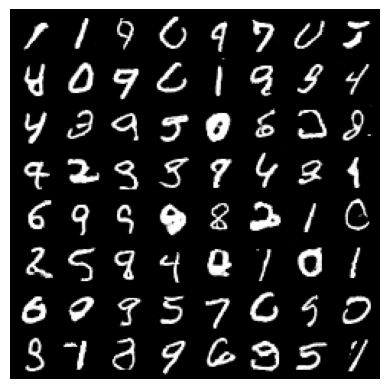

Epoch [89/100], Batch [100/938], D_real: 0.9257, D_fake: 0.0102, Loss_D: 0.0975, Loss_G: 6.0408
Epoch [89/100], Batch [200/938], D_real: 0.7891, D_fake: 0.0186, Loss_D: 0.3239, Loss_G: 2.8232
Epoch [89/100], Batch [300/938], D_real: 0.8988, D_fake: 0.0543, Loss_D: 0.1861, Loss_G: 3.8961
Epoch [89/100], Batch [400/938], D_real: 0.9854, D_fake: 0.0680, Loss_D: 0.0938, Loss_G: 3.7939
Epoch [89/100], Batch [500/938], D_real: 0.9678, D_fake: 0.1609, Loss_D: 0.2580, Loss_G: 3.9225
Epoch [89/100], Batch [600/938], D_real: 0.9857, D_fake: 0.0914, Loss_D: 0.1279, Loss_G: 4.1670
Epoch [89/100], Batch [700/938], D_real: 0.8858, D_fake: 0.1119, Loss_D: 0.2860, Loss_G: 3.6447
Epoch [89/100], Batch [800/938], D_real: 0.9387, D_fake: 0.0258, Loss_D: 0.1128, Loss_G: 3.8267
Epoch [89/100], Batch [900/938], D_real: 0.9740, D_fake: 0.1145, Loss_D: 0.1814, Loss_G: 3.2888


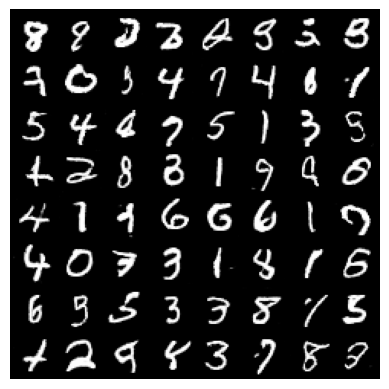

Epoch [90/100], Batch [100/938], D_real: 0.8658, D_fake: 0.0875, Loss_D: 0.2706, Loss_G: 3.3113
Epoch [90/100], Batch [200/938], D_real: 0.9638, D_fake: 0.1206, Loss_D: 0.2051, Loss_G: 2.5957
Epoch [90/100], Batch [300/938], D_real: 0.9273, D_fake: 0.1449, Loss_D: 0.3243, Loss_G: 3.1550
Epoch [90/100], Batch [400/938], D_real: 0.9178, D_fake: 0.0196, Loss_D: 0.1142, Loss_G: 4.6563
Epoch [90/100], Batch [500/938], D_real: 0.9765, D_fake: 0.1760, Loss_D: 0.2749, Loss_G: 2.7791
Epoch [90/100], Batch [600/938], D_real: 0.9250, D_fake: 0.0809, Loss_D: 0.1869, Loss_G: 4.4182
Epoch [90/100], Batch [700/938], D_real: 0.9740, D_fake: 0.1419, Loss_D: 0.2029, Loss_G: 3.2653
Epoch [90/100], Batch [800/938], D_real: 0.9017, D_fake: 0.0557, Loss_D: 0.1839, Loss_G: 4.8965
Epoch [90/100], Batch [900/938], D_real: 0.9486, D_fake: 0.0211, Loss_D: 0.0791, Loss_G: 6.2048


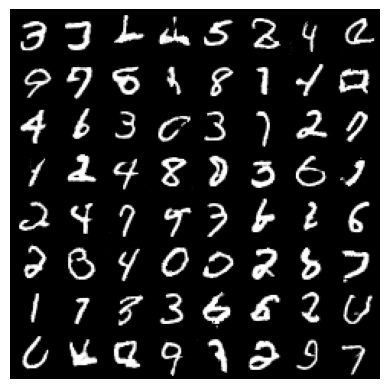

Epoch [91/100], Batch [100/938], D_real: 0.9465, D_fake: 0.0459, Loss_D: 0.1110, Loss_G: 5.3474
Epoch [91/100], Batch [200/938], D_real: 0.9890, D_fake: 0.1513, Loss_D: 0.2128, Loss_G: 2.8982
Epoch [91/100], Batch [300/938], D_real: 0.9560, D_fake: 0.2043, Loss_D: 0.4516, Loss_G: 2.4313
Epoch [91/100], Batch [400/938], D_real: 0.8318, D_fake: 0.0056, Loss_D: 0.2374, Loss_G: 6.4786
Epoch [91/100], Batch [500/938], D_real: 0.9739, D_fake: 0.0579, Loss_D: 0.0915, Loss_G: 3.7049
Epoch [91/100], Batch [600/938], D_real: 0.9225, D_fake: 0.0152, Loss_D: 0.1036, Loss_G: 5.1972
Epoch [91/100], Batch [700/938], D_real: 0.9194, D_fake: 0.0986, Loss_D: 0.2151, Loss_G: 5.1381
Epoch [91/100], Batch [800/938], D_real: 0.9572, D_fake: 0.0478, Loss_D: 0.1021, Loss_G: 3.6841
Epoch [91/100], Batch [900/938], D_real: 0.9969, D_fake: 0.3509, Loss_D: 0.6503, Loss_G: 2.0946


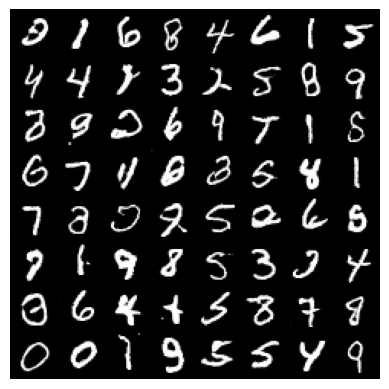

Epoch [92/100], Batch [100/938], D_real: 0.9089, D_fake: 0.0168, Loss_D: 0.1287, Loss_G: 5.7418
Epoch [92/100], Batch [200/938], D_real: 0.7906, D_fake: 0.0329, Loss_D: 0.3341, Loss_G: 3.8900
Epoch [92/100], Batch [300/938], D_real: 0.9418, D_fake: 0.0228, Loss_D: 0.0941, Loss_G: 5.1845
Epoch [92/100], Batch [400/938], D_real: 0.8738, D_fake: 0.0509, Loss_D: 0.2108, Loss_G: 4.0006
Epoch [92/100], Batch [500/938], D_real: 0.7703, D_fake: 0.0559, Loss_D: 0.4060, Loss_G: 3.5109
Epoch [92/100], Batch [600/938], D_real: 0.9520, D_fake: 0.0231, Loss_D: 0.0838, Loss_G: 5.0610
Epoch [92/100], Batch [700/938], D_real: 0.8781, D_fake: 0.0364, Loss_D: 0.2090, Loss_G: 5.9473
Epoch [92/100], Batch [800/938], D_real: 0.8769, D_fake: 0.0349, Loss_D: 0.1889, Loss_G: 3.9769
Epoch [92/100], Batch [900/938], D_real: 0.9820, D_fake: 0.2905, Loss_D: 0.5194, Loss_G: 3.6764


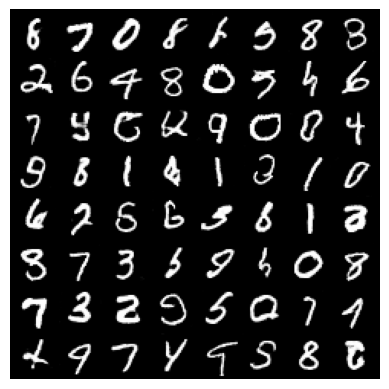

Epoch [93/100], Batch [100/938], D_real: 0.8774, D_fake: 0.0181, Loss_D: 0.1623, Loss_G: 4.3586
Epoch [93/100], Batch [200/938], D_real: 0.9060, D_fake: 0.0193, Loss_D: 0.1341, Loss_G: 6.5590
Epoch [93/100], Batch [300/938], D_real: 0.9568, D_fake: 0.0219, Loss_D: 0.0696, Loss_G: 4.4951
Epoch [93/100], Batch [400/938], D_real: 0.9745, D_fake: 0.0285, Loss_D: 0.0593, Loss_G: 4.7813
Epoch [93/100], Batch [500/938], D_real: 0.9954, D_fake: 0.2833, Loss_D: 0.5797, Loss_G: 2.5336
Epoch [93/100], Batch [600/938], D_real: 0.9720, D_fake: 0.1177, Loss_D: 0.1880, Loss_G: 3.7947
Epoch [93/100], Batch [700/938], D_real: 0.9837, D_fake: 0.0413, Loss_D: 0.0620, Loss_G: 4.4267
Epoch [93/100], Batch [800/938], D_real: 0.7315, D_fake: 0.0128, Loss_D: 0.4088, Loss_G: 6.3783
Epoch [93/100], Batch [900/938], D_real: 0.6853, D_fake: 0.0313, Loss_D: 0.5539, Loss_G: 4.4111


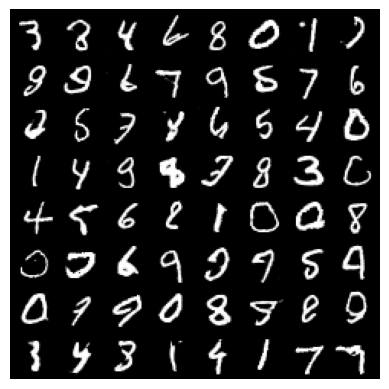

Epoch [94/100], Batch [100/938], D_real: 0.9707, D_fake: 0.1445, Loss_D: 0.2642, Loss_G: 3.8294
Epoch [94/100], Batch [200/938], D_real: 0.9376, D_fake: 0.0403, Loss_D: 0.1162, Loss_G: 4.9602
Epoch [94/100], Batch [300/938], D_real: 0.8653, D_fake: 0.0161, Loss_D: 0.2049, Loss_G: 6.4652
Epoch [94/100], Batch [400/938], D_real: 0.9953, D_fake: 0.4325, Loss_D: 0.7946, Loss_G: 2.9839
Epoch [94/100], Batch [500/938], D_real: 0.9591, D_fake: 0.1271, Loss_D: 0.2416, Loss_G: 4.6380
Epoch [94/100], Batch [600/938], D_real: 0.8376, D_fake: 0.0339, Loss_D: 0.2587, Loss_G: 4.2684
Epoch [94/100], Batch [700/938], D_real: 0.9801, D_fake: 0.0560, Loss_D: 0.0850, Loss_G: 3.8133
Epoch [94/100], Batch [800/938], D_real: 0.9285, D_fake: 0.0655, Loss_D: 0.1678, Loss_G: 4.6694
Epoch [94/100], Batch [900/938], D_real: 0.9795, D_fake: 0.0474, Loss_D: 0.0845, Loss_G: 5.7816


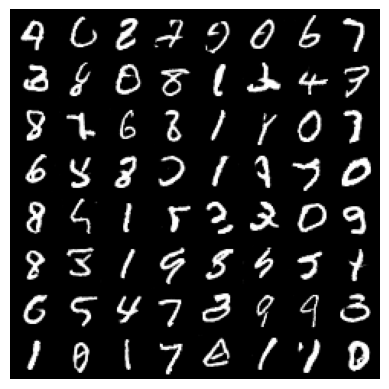

Epoch [95/100], Batch [100/938], D_real: 0.9926, D_fake: 0.1053, Loss_D: 0.1429, Loss_G: 2.6339
Epoch [95/100], Batch [200/938], D_real: 0.9465, D_fake: 0.2546, Loss_D: 0.4444, Loss_G: 2.9887
Epoch [95/100], Batch [300/938], D_real: 0.8153, D_fake: 0.0047, Loss_D: 0.2440, Loss_G: 6.0798
Epoch [95/100], Batch [400/938], D_real: 0.9543, D_fake: 0.1123, Loss_D: 0.2208, Loss_G: 3.2438
Epoch [95/100], Batch [500/938], D_real: 0.9471, D_fake: 0.0518, Loss_D: 0.1176, Loss_G: 4.2161
Epoch [95/100], Batch [600/938], D_real: 0.9433, D_fake: 0.0457, Loss_D: 0.1293, Loss_G: 4.9041
Epoch [95/100], Batch [700/938], D_real: 0.7806, D_fake: 0.0680, Loss_D: 0.3755, Loss_G: 3.7399
Epoch [95/100], Batch [800/938], D_real: 0.9924, D_fake: 0.1233, Loss_D: 0.1940, Loss_G: 4.6243
Epoch [95/100], Batch [900/938], D_real: 0.8719, D_fake: 0.0458, Loss_D: 0.2244, Loss_G: 3.7844


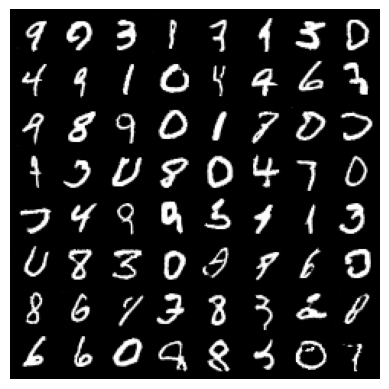

Epoch [96/100], Batch [100/938], D_real: 0.9573, D_fake: 0.0550, Loss_D: 0.1140, Loss_G: 4.1687
Epoch [96/100], Batch [200/938], D_real: 0.9908, D_fake: 0.1322, Loss_D: 0.1779, Loss_G: 2.5339
Epoch [96/100], Batch [300/938], D_real: 0.8730, D_fake: 0.0404, Loss_D: 0.2101, Loss_G: 4.0335
Epoch [96/100], Batch [400/938], D_real: 0.9400, D_fake: 0.0224, Loss_D: 0.0890, Loss_G: 5.4986
Epoch [96/100], Batch [500/938], D_real: 0.9569, D_fake: 0.0251, Loss_D: 0.0735, Loss_G: 5.4553
Epoch [96/100], Batch [600/938], D_real: 0.8261, D_fake: 0.0816, Loss_D: 0.3532, Loss_G: 1.9800
Epoch [96/100], Batch [700/938], D_real: 0.9515, D_fake: 0.1218, Loss_D: 0.2206, Loss_G: 4.5199
Epoch [96/100], Batch [800/938], D_real: 0.7249, D_fake: 0.0475, Loss_D: 0.4996, Loss_G: 4.4234
Epoch [96/100], Batch [900/938], D_real: 0.9563, D_fake: 0.1130, Loss_D: 0.2136, Loss_G: 4.1045


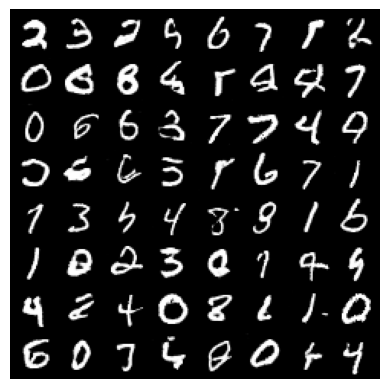

Epoch [97/100], Batch [100/938], D_real: 0.9726, D_fake: 0.0299, Loss_D: 0.0606, Loss_G: 5.5395
Epoch [97/100], Batch [200/938], D_real: 0.9730, D_fake: 0.1130, Loss_D: 0.1732, Loss_G: 5.2010
Epoch [97/100], Batch [300/938], D_real: 0.9914, D_fake: 0.1466, Loss_D: 0.2002, Loss_G: 1.8708
Epoch [97/100], Batch [400/938], D_real: 0.9965, D_fake: 0.3615, Loss_D: 0.5926, Loss_G: 2.3997
Epoch [97/100], Batch [500/938], D_real: 0.9634, D_fake: 0.0855, Loss_D: 0.1370, Loss_G: 3.1961
Epoch [97/100], Batch [600/938], D_real: 0.9097, D_fake: 0.0781, Loss_D: 0.1996, Loss_G: 3.9529
Epoch [97/100], Batch [700/938], D_real: 0.9915, D_fake: 0.1398, Loss_D: 0.1934, Loss_G: 2.7764
Epoch [97/100], Batch [800/938], D_real: 0.9313, D_fake: 0.0638, Loss_D: 0.1541, Loss_G: 4.8755
Epoch [97/100], Batch [900/938], D_real: 0.9630, D_fake: 0.1481, Loss_D: 0.2498, Loss_G: 4.9470


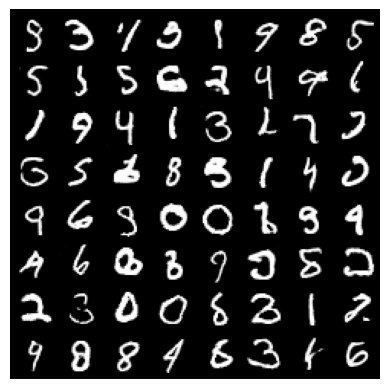

Epoch [98/100], Batch [100/938], D_real: 0.9230, D_fake: 0.0678, Loss_D: 0.1960, Loss_G: 3.9615
Epoch [98/100], Batch [200/938], D_real: 0.9374, D_fake: 0.0432, Loss_D: 0.1262, Loss_G: 6.0096
Epoch [98/100], Batch [300/938], D_real: 0.7764, D_fake: 0.0072, Loss_D: 0.3132, Loss_G: 5.5149
Epoch [98/100], Batch [400/938], D_real: 0.8625, D_fake: 0.0077, Loss_D: 0.1799, Loss_G: 5.1796
Epoch [98/100], Batch [500/938], D_real: 0.6965, D_fake: 0.0030, Loss_D: 0.5077, Loss_G: 7.1103
Epoch [98/100], Batch [600/938], D_real: 0.9887, D_fake: 0.1778, Loss_D: 0.2672, Loss_G: 2.7501
Epoch [98/100], Batch [700/938], D_real: 0.9209, D_fake: 0.0640, Loss_D: 0.1737, Loss_G: 2.5907
Epoch [98/100], Batch [800/938], D_real: 0.9115, D_fake: 0.0460, Loss_D: 0.1717, Loss_G: 5.0632
Epoch [98/100], Batch [900/938], D_real: 0.9909, D_fake: 0.0458, Loss_D: 0.0609, Loss_G: 4.9360


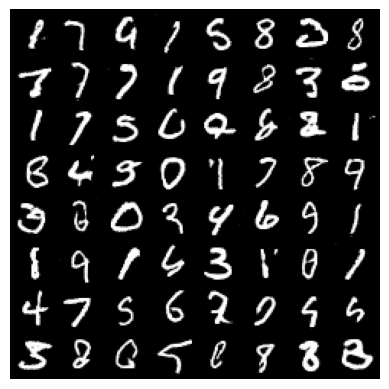

Epoch [99/100], Batch [100/938], D_real: 0.9879, D_fake: 0.1404, Loss_D: 0.2271, Loss_G: 3.9910
Epoch [99/100], Batch [200/938], D_real: 0.8563, D_fake: 0.0122, Loss_D: 0.2140, Loss_G: 6.6029
Epoch [99/100], Batch [300/938], D_real: 0.9678, D_fake: 0.0533, Loss_D: 0.0956, Loss_G: 4.4975
Epoch [99/100], Batch [400/938], D_real: 0.5383, D_fake: 0.0078, Loss_D: 0.9035, Loss_G: 3.9264
Epoch [99/100], Batch [500/938], D_real: 0.7821, D_fake: 0.0459, Loss_D: 0.3474, Loss_G: 4.3993
Epoch [99/100], Batch [600/938], D_real: 0.8564, D_fake: 0.0160, Loss_D: 0.1957, Loss_G: 6.0308
Epoch [99/100], Batch [700/938], D_real: 0.9561, D_fake: 0.0962, Loss_D: 0.1734, Loss_G: 3.3056
Epoch [99/100], Batch [800/938], D_real: 0.9620, D_fake: 0.0948, Loss_D: 0.1674, Loss_G: 3.1638
Epoch [99/100], Batch [900/938], D_real: 0.9237, D_fake: 0.0423, Loss_D: 0.1404, Loss_G: 6.3197


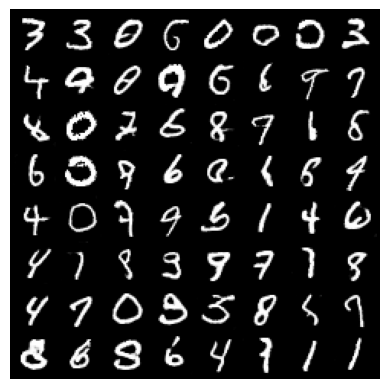

Epoch [100/100], Batch [100/938], D_real: 0.9548, D_fake: 0.2084, Loss_D: 0.3803, Loss_G: 3.7632
Epoch [100/100], Batch [200/938], D_real: 0.9239, D_fake: 0.0487, Loss_D: 0.1566, Loss_G: 5.7955
Epoch [100/100], Batch [300/938], D_real: 0.8408, D_fake: 0.0404, Loss_D: 0.2739, Loss_G: 5.1497
Epoch [100/100], Batch [400/938], D_real: 0.9135, D_fake: 0.1192, Loss_D: 0.2742, Loss_G: 2.6399
Epoch [100/100], Batch [500/938], D_real: 0.8541, D_fake: 0.0182, Loss_D: 0.2015, Loss_G: 4.9207
Epoch [100/100], Batch [600/938], D_real: 0.9789, D_fake: 0.1185, Loss_D: 0.1872, Loss_G: 3.9604
Epoch [100/100], Batch [700/938], D_real: 0.9760, D_fake: 0.0488, Loss_D: 0.0804, Loss_G: 3.7272
Epoch [100/100], Batch [800/938], D_real: 0.8773, D_fake: 0.0458, Loss_D: 0.2091, Loss_G: 4.3943
Epoch [100/100], Batch [900/938], D_real: 0.9105, D_fake: 0.0634, Loss_D: 0.1731, Loss_G: 4.1140


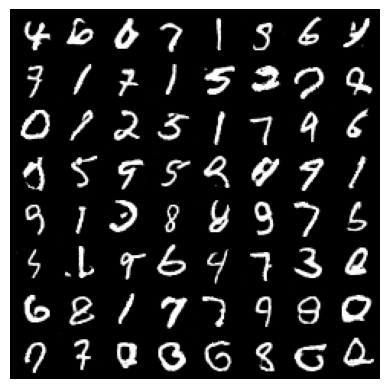

In [11]:
# Training loop
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(data_loader):
        #Loops through the data_loader, fetching one batch of real MNIST images.
        real_images = real_images.cuda() #first, we move them to the GPU for faster time in training
        batch_size = real_images.size(0) #second, we save the batch size of data

        # Train discriminator with real images
        optimizer_d.zero_grad()  # Reset gradients
        label_real = torch.ones(batch_size, 1).cuda()  # Label for real images = 1
        output_real = discriminator(real_images).view(-1, 1)  # Forward pass
        loss_real = criterion(output_real, label_real)  # Compute BCE loss
        loss_real.backward()  # Backpropagate

        # Train discriminator with fake images
        noise = torch.randn(batch_size, latent_dim, 1, 1).cuda() #lets build  noises vector
        fake_images = generator(noise)# lets buld  fake images by given noise with out generator module
        label_fake = torch.zeros(batch_size, 1).cuda()  # Label for fake images = 1
        output_fake = discriminator(fake_images.detach()).view(-1, 1) #Forward pass for generated images
        loss_fake = criterion(output_fake, label_fake) #Compute BCE loss for fake section
        loss_fake.backward()
        optimizer_d.step() #This line is crucial in the training process of the Discriminator.
        # It updates the weights of the Discriminator based on the computed gradients from the loss function.

        # Train generator
        optimizer_g.zero_grad()
        output = discriminator(fake_images).view(-1, 1)
        loss_g = criterion(output, label_real)
        loss_g.backward()
        optimizer_g.step()

        if (i + 1) % 100 == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}], Batch [{i+1}/{len(data_loader)}], '
                  f'D_real: {output_real.mean():.4f}, D_fake: {output_fake.mean():.4f}, '
                  f'Loss_D: {loss_real.item() + loss_fake.item():.4f}, Loss_G: {loss_g.item():.4f}')
            # Generate and save sample images at the end of each epoch
    with torch.no_grad():
        #Disables gradient tracking (since we’re not training here)
        #Generates fake images using the Generator
        fake_samples = generator(torch.randn(64, latent_dim, 1, 1).cuda())
        fake_samples = fake_samples.cpu()
        #Combines a batch of images into a single grid image
        fake_grid = torchvision.utils.make_grid(fake_samples, padding=2, normalize=True)
        # Why np.transpose(fake_grid, (1, 2, 0))?
        # PyTorch images are in CHW format (Channels, Height, Width),
        # but matplotlib.pyplot.imshow() expects HWC format.
        plt.imshow(np.transpose(fake_grid, (1, 2, 0)))
        plt.axis('off')
        plt.show()

In [12]:
# Save the trained generator model
torch.save(generator.state_dict(), 'generator.pth')